In [130]:
import pandas as pd
from math import radians, sin, cos, sqrt, atan2
import networkx as nx
import matplotlib.pyplot as plt
from queue import PriorityQueue

#### Funções para o cálculo de distância entre uma estação e outra no DataFrame

In [131]:
def haversine_distance(lat1, lon1, lat2, lon2):
    R = 6371.0 * 1000

    lat1 = radians(lat1)
    lon1 = radians(lon1)
    lat2 = radians(lat2)
    lon2 = radians(lon2)

    dlon = lon2 - lon1
    dlat = lat2 - lat1

    a = sin(dlat / 2) ** 2 + cos(lat1) * cos(lat2) * sin(dlon / 2) ** 2
    c = 2 * atan2(sqrt(a), sqrt(1 - a))

    distance = R * c
    return round(distance, 2)


def get_station_info(station_name, df):
    station_rows = df[df["Station"] == station_name]
    if not station_rows.empty:
        station_info = {
            "Latitude": station_rows.iloc[0]["Latitude"],
            "Longitude": station_rows.iloc[0]["Longitude"],
            "Lines": set(station_rows["Line"]),
        }
        return station_info
    else:
        return None


def calculate_distance(row, df):
    origin_info = get_station_info(row["Station"], df)
    dest_info = get_station_info(row["Destination"], df)

    if origin_info and dest_info:
        if origin_info["Lines"].intersection(dest_info["Lines"]):
            return haversine_distance(
                origin_info["Latitude"],
                origin_info["Longitude"],
                dest_info["Latitude"],
                dest_info["Longitude"],
            )
    return None

#### Formatações do Dataframe

In [132]:
df = pd.read_csv("Metro_Madrid_2021.csv")
df = df.drop("Traffic", axis=1)
df["Longitude"] = df["Longitude"].str.replace(",", ".").astype(float)
df["Latitude"] = df["Latitude"].str.replace(",", ".").astype(float)
df.insert(1, "Destination", df["Station"].shift(-1))
df.insert(2, "Distance", df.apply(lambda row: calculate_distance(row, df), axis=1))
df = df.dropna(subset=["Distance"])
df.drop(df.loc[df["Distance"] > 5000].index, inplace=True)
new_rows = df.copy()
new_rows.rename(
    columns={"Station": "Destination", "Destination": "Station"}, inplace=True
)
df = pd.concat([df, new_rows], ignore_index=True)

In [133]:
df.head()

,Station,Destination,Distance,Line,Order of Points,Longitude,Latitude
0,Pinar de Chamartin,Bambú,867.28,Linea 1,1,-3.667061,40.480136
1,Bambú,Chamartín,754.71,Linea 1,2,-3.676374,40.476872
2,Chamartín,Plaza de Castilla,799.03,Linea 1,3,-3.682768,40.472138
3,Plaza de Castilla,Valdeacederas,573.41,Linea 1,4,-3.689163,40.466849
4,Valdeacederas,Tetuán,422.98,Linea 1,5,-3.695128,40.464401


#### Criação do grafo

In [134]:
graph_df = df[["Station", "Destination", "Distance"]]
graph_df = graph_df.dropna()

In [135]:
graph = {}
#Colocando todos dos dados do DataFrame em um Dict
for row in df.itertuples():
    station = row.Station
    destination = row.Destination
    distance = row.Distance

    if pd.isna(distance):
        continue

    if station not in graph:
        graph[station] = []

    graph[station].append((destination, distance))

## A* (busca informada)

In [136]:
def heuristic(station1, station2, stations_info):
    lat1, lon1 = stations_info[station1]
    lat2, lon2 = stations_info[station2]
    # Distância euclidiana (aproximação para pequenas distâncias)
    return sqrt((lat1 - lat2) ** 2 + (lon1 - lon2) ** 2)

In [186]:
def visualize_graph(graph_dict, df, path):
    # Criando o grafo NetworkX a partir do dicionário
    G = nx.Graph()
    for station, adjacents in graph_dict.items():
        for destination, distance in adjacents:
            G.add_edge(station, destination, weight=distance)

    # Adicionando posições ao grafo
    pos = {
        row["Station"]: (row["Longitude"], row["Latitude"])
        for idx, row in df.iterrows()
    }

    plt.figure(figsize=(20, 15))

    # Desenha os nós e arestas com estilo básico
    nx.draw(G, pos, node_size=50, node_color="blue", edge_color="gray", alpha=0.5)

    # Desenha o caminho com um estilo diferente, se existir
    if path:
        path_edges = list(zip(path, path[1:]))
        nx.draw_networkx_nodes(G, pos, nodelist=path, node_size=100, node_color="red")
        nx.draw_networkx_edges(G, pos, edgelist=path_edges, edge_color="red", width=2)
        # Cria rótulos apenas para os nós do caminho
        labels = {node: node for node in path}
        nx.draw_networkx_labels(G, pos, labels=labels, font_size=5)

    plt.title("Mapa do Metrô de Madrid com Caminho A*")
    plt.axis("off")
    plt.show()

In [201]:
def a_star(graph, start, end, nodes_explored, stations_info):
    current_path = []
    open_set = PriorityQueue()
    open_set.put((0, start))
    came_from = {}
    real_cost = {node: float("inf") for node in graph}
    real_cost[start] = 0
    est_cost = {node: float("inf") for node in graph}
    est_cost[start] = heuristic(start, end, stations_info)

    nodes_explored = 0  # Contador para os nós explorados

    while not open_set.empty():
        current = open_set.get()[1]
        current_path.append(current)
        nodes_explored += 1  # Incrementa a contagem de nós explorados
        print("-----------------------------------------------------------------------")
        print("Explorando nó:", current)
        print("Custo Real:", real_cost[current])
        print("Custo Estimado:", est_cost[current])
        visualize_graph(graph, df, current_path)
        if current == end:
            path = []
            while current in came_from:
                path.append(current)
                current = came_from[current]
            path.append(start)
            visualize_graph(graph, df, current_path)
            return path[::-1], nodes_explored

        for neighbor, distance in graph[current]:
            tentative_real_cost = real_cost[current] + distance
            print("Tentativa Custo Real para", neighbor, ":", tentative_real_cost)
            if tentative_real_cost < real_cost[neighbor]:
                came_from[neighbor] = current
                real_cost[neighbor] = tentative_real_cost
                est_cost[neighbor] = tentative_real_cost + heuristic(
                    neighbor, end, stations_info
                )
                open_set.put((est_cost[neighbor], neighbor))
                print("Atualizando Custo Real e Custo Estimado para", neighbor, ":")
                print("   Custo Real:", real_cost[neighbor])
                print("   Custo Estimado:", est_cost[neighbor])

    return None, nodes_explored  # Se não houver caminho

-----------------------------------------------------------------------
Explorando nó: Pinar de Chamartín
Custo Real: 0
Custo Estimado: 0.06335976014240319


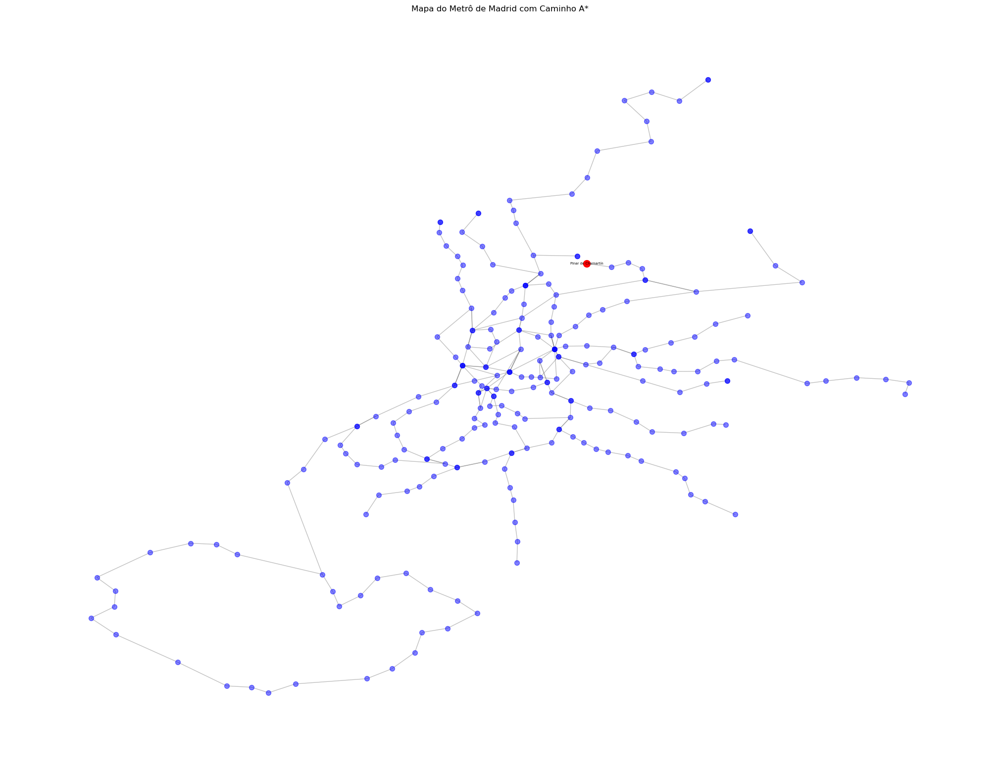

Tentativa Custo Real para Manoteras : 518.39
Atualizando Custo Real e Custo Estimado para Manoteras :
   Custo Real: 518.39
   Custo Estimado: 518.4533597601423
-----------------------------------------------------------------------
Explorando nó: Manoteras
Custo Real: 518.39
Custo Estimado: 518.4533597601423


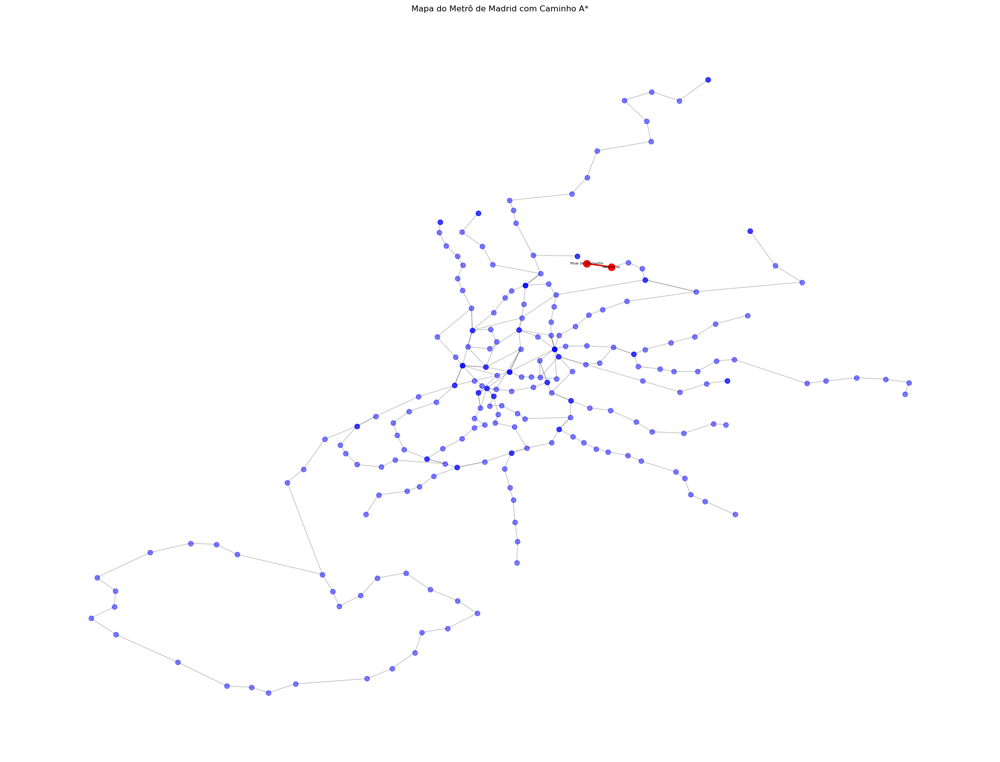

Tentativa Custo Real para Pinar de Chamartín : 1036.78
Tentativa Custo Real para Hortaleza : 1418.4299999999998
Atualizando Custo Real e Custo Estimado para Hortaleza :
   Custo Real: 1418.4299999999998
   Custo Estimado: 1418.4990246050572
-----------------------------------------------------------------------
Explorando nó: Hortaleza
Custo Real: 1418.4299999999998
Custo Estimado: 1418.4990246050572


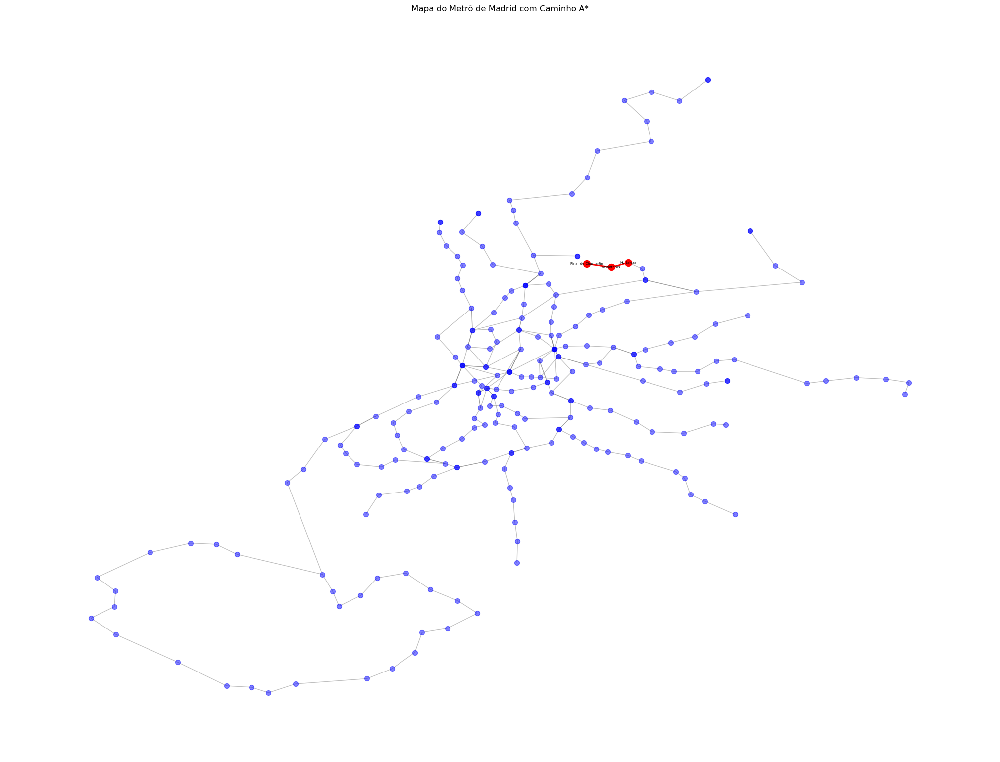

Tentativa Custo Real para Manoteras : 2318.47
Tentativa Custo Real para Parque de Santa María : 2074.3999999999996
Atualizando Custo Real e Custo Estimado para Parque de Santa María :
   Custo Real: 2074.3999999999996
   Custo Estimado: 2074.4757074234894
-----------------------------------------------------------------------
Explorando nó: Parque de Santa María
Custo Real: 2074.3999999999996
Custo Estimado: 2074.4757074234894


C:\Users\user\AppData\Local\Temp\ipykernel_19540\1861580518.py:23: DeprecationWarning: `alltrue` is deprecated as of NumPy 1.25.0, and will be removed in NumPy 2.0. Please use `all` instead.
  nx.draw_networkx_edges(G, pos, edgelist=path_edges, edge_color="red", width=2)


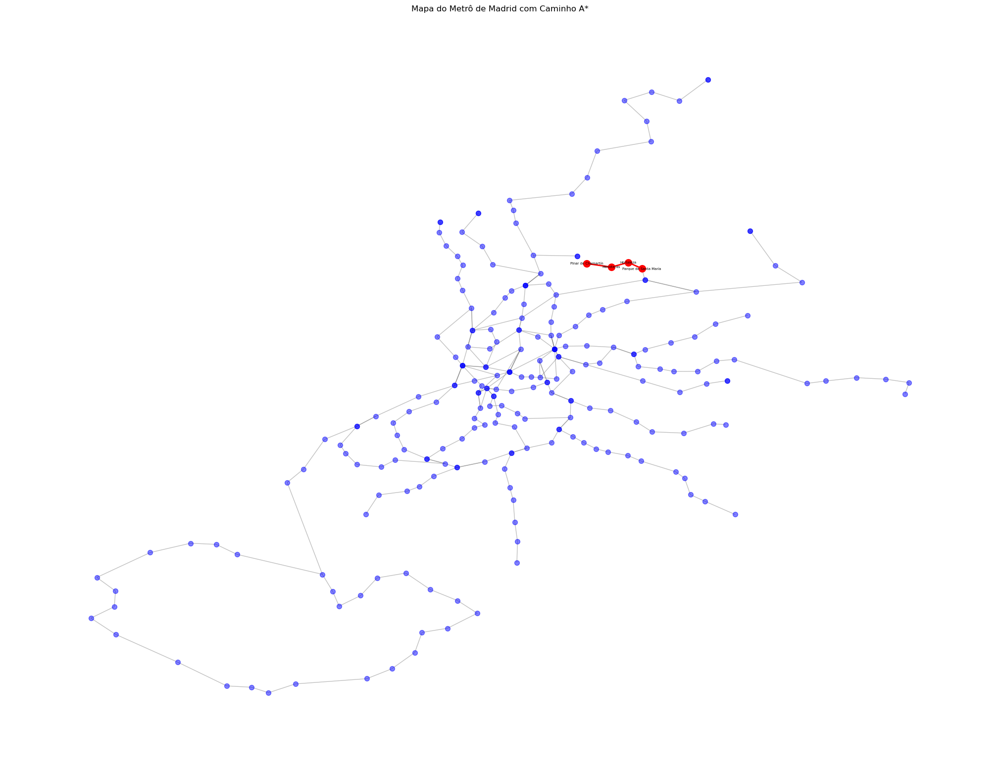

Tentativa Custo Real para Hortaleza : 2730.37
Tentativa Custo Real para San Lorenzo : 2654.6499999999996
Atualizando Custo Real e Custo Estimado para San Lorenzo :
   Custo Real: 2654.6499999999996
   Custo Estimado: 2654.728394441119
-----------------------------------------------------------------------
Explorando nó: San Lorenzo
Custo Real: 2654.6499999999996
Custo Estimado: 2654.728394441119


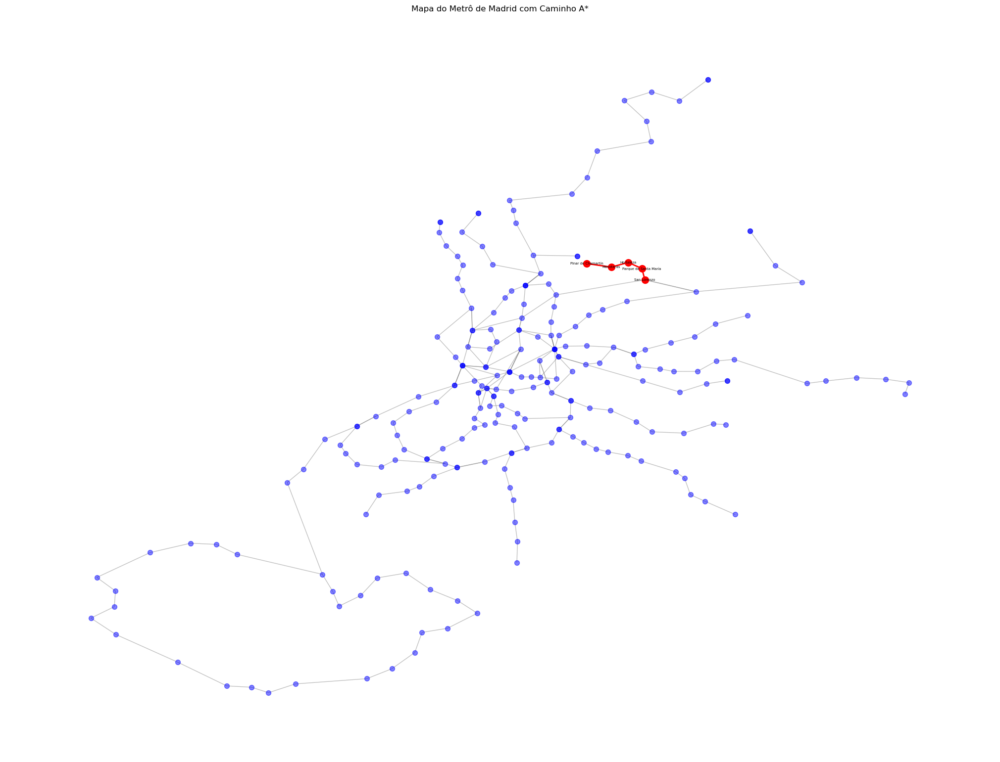

Tentativa Custo Real para Parque de Santa María : 3234.8999999999996
Tentativa Custo Real para Mar de Cristal : 3229.8799999999997
Atualizando Custo Real e Custo Estimado para Mar de Cristal :
   Custo Real: 3229.8799999999997
   Custo Estimado: 3229.9563996090683
-----------------------------------------------------------------------
Explorando nó: Mar de Cristal
Custo Real: 3229.8799999999997
Custo Estimado: 3229.9563996090683


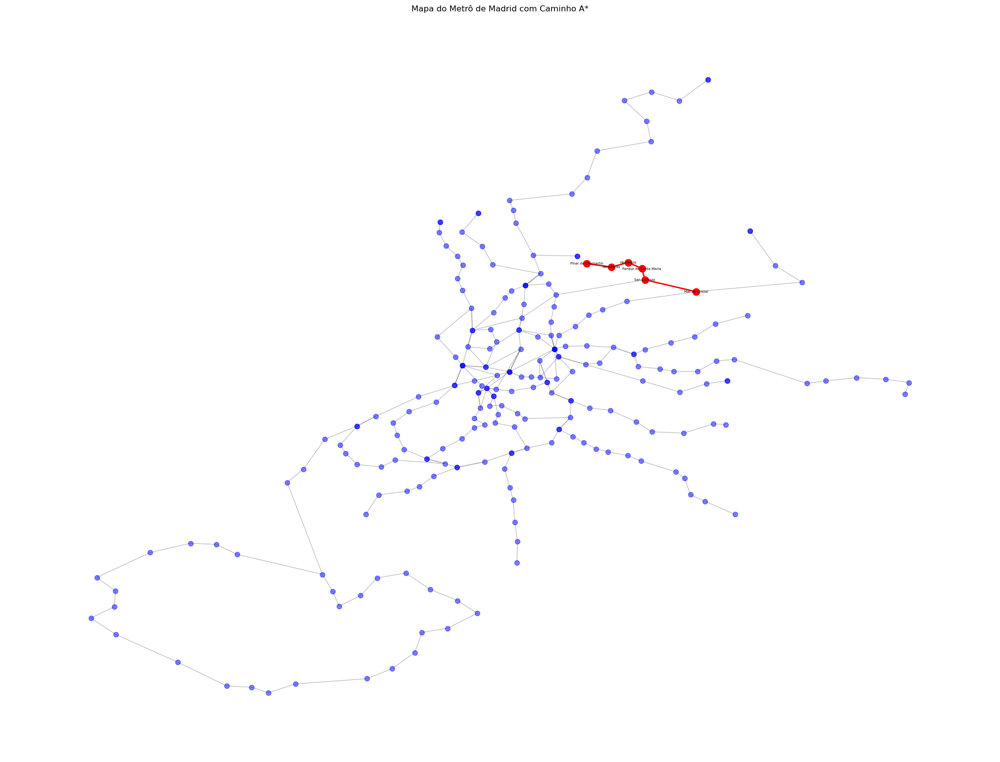

Tentativa Custo Real para San Lorenzo : 3805.1099999999997
Tentativa Custo Real para Pinar del Rey : 4077.7599999999998
Atualizando Custo Real e Custo Estimado para Pinar del Rey :
   Custo Real: 4077.7599999999998
   Custo Estimado: 4077.8276911540966
Tentativa Custo Real para Canillas : 3835.08
Atualizando Custo Real e Custo Estimado para Canillas :
   Custo Real: 3835.08
   Custo Estimado: 3835.1560129538657
Tentativa Custo Real para Feria de Madrid : 5171.099999999999
Atualizando Custo Real e Custo Estimado para Feria de Madrid :
   Custo Real: 5171.099999999999
   Custo Estimado: 5171.192883385647
-----------------------------------------------------------------------
Explorando nó: Canillas
Custo Real: 3835.08
Custo Estimado: 3835.1560129538657


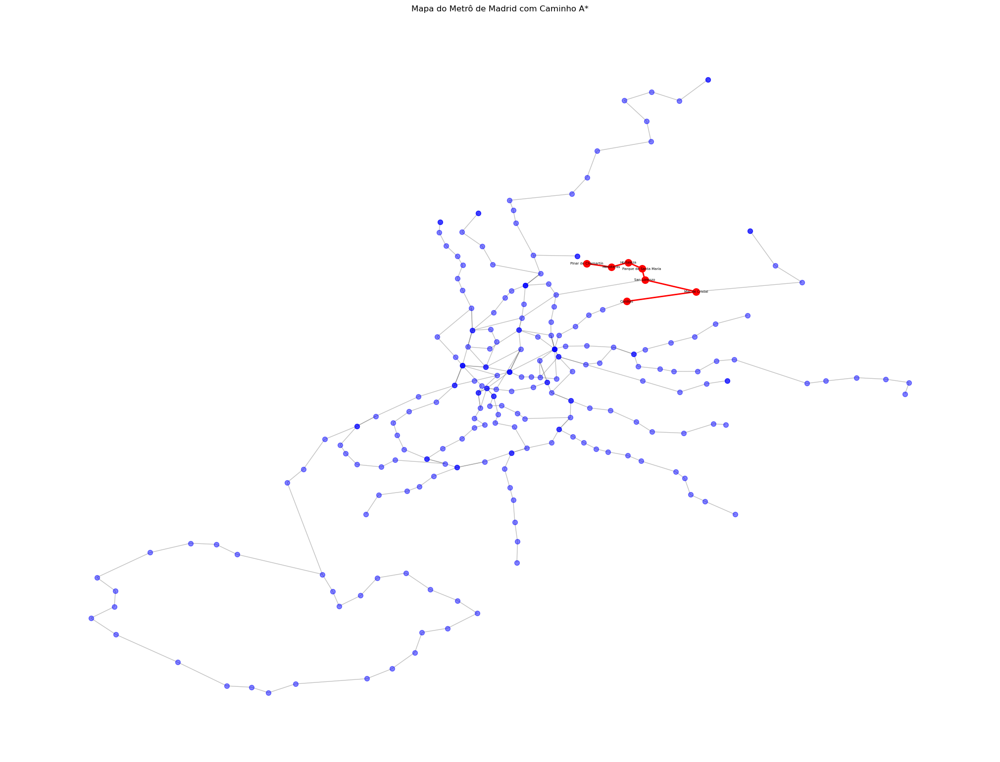

Tentativa Custo Real para Mar de Cristal : 4440.28
Tentativa Custo Real para Esperanza : 4862.47
Atualizando Custo Real e Custo Estimado para Esperanza :
   Custo Real: 4862.47
   Custo Estimado: 4862.534627932866
-----------------------------------------------------------------------
Explorando nó: Pinar del Rey
Custo Real: 4077.7599999999998
Custo Estimado: 4077.8276911540966


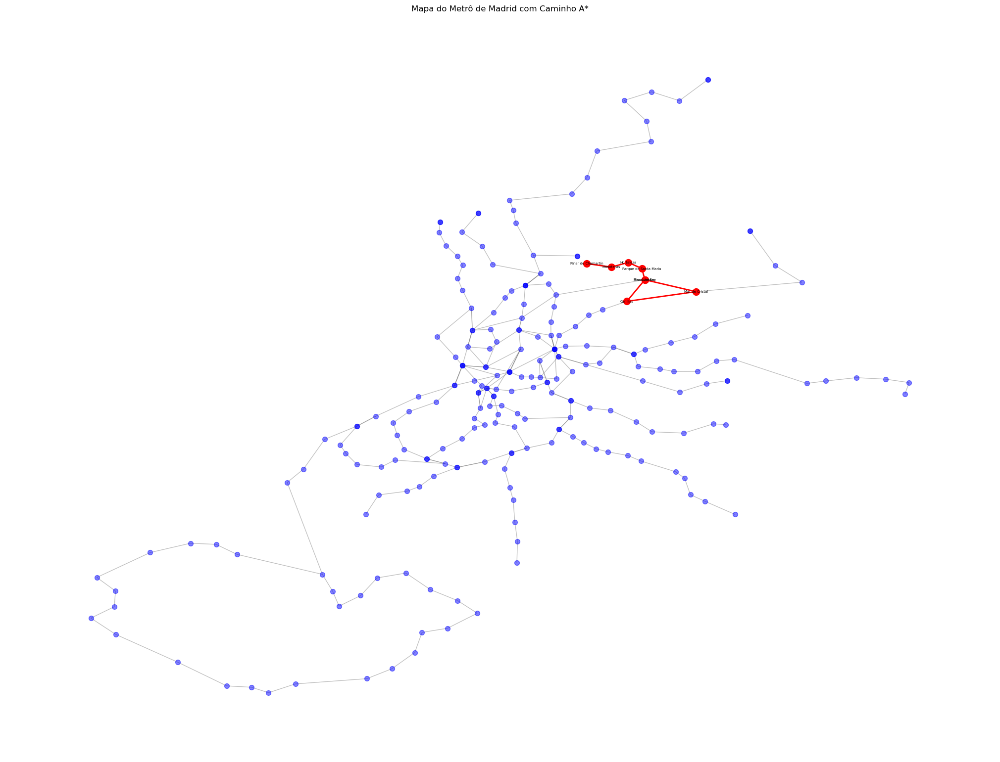

Tentativa Custo Real para Colombia : 6801.11
Atualizando Custo Real e Custo Estimado para Colombia :
   Custo Real: 6801.11
   Custo Estimado: 6801.1494707153415
Tentativa Custo Real para Mar de Cristal : 4925.639999999999
-----------------------------------------------------------------------
Explorando nó: Esperanza
Custo Real: 4862.47
Custo Estimado: 4862.534627932866


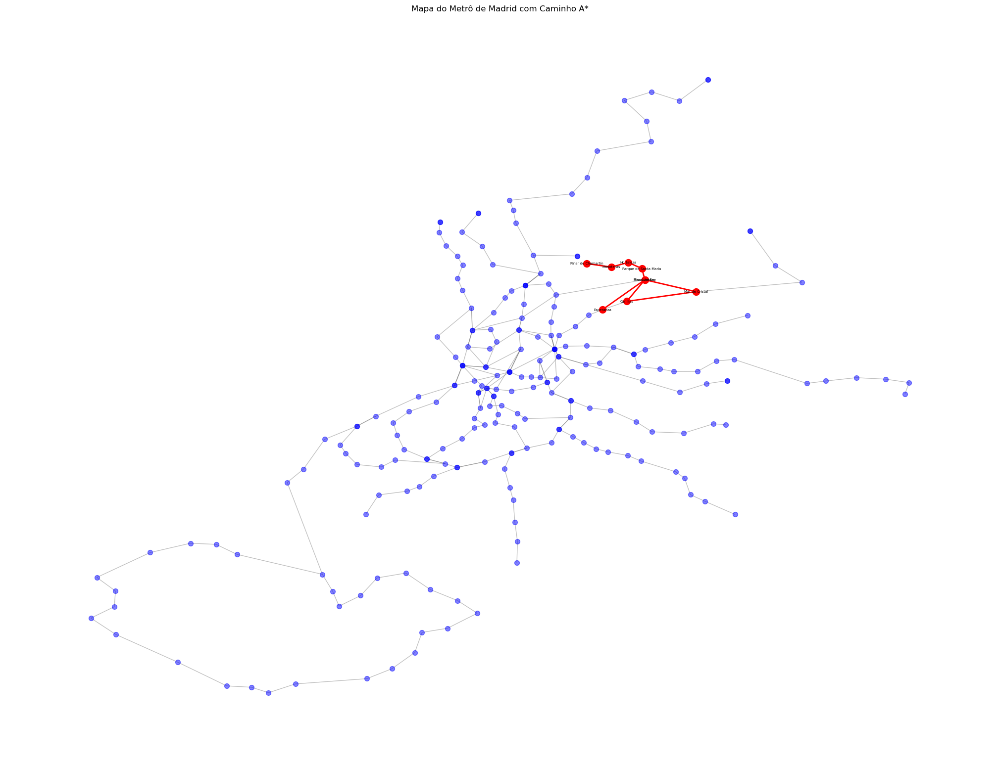

Tentativa Custo Real para Canillas : 5889.860000000001
Tentativa Custo Real para Arturo Soria : 5837.93
Atualizando Custo Real e Custo Estimado para Arturo Soria :
   Custo Real: 5837.93
   Custo Estimado: 5837.983813797689
-----------------------------------------------------------------------
Explorando nó: Feria de Madrid
Custo Real: 5171.099999999999
Custo Estimado: 5171.192883385647


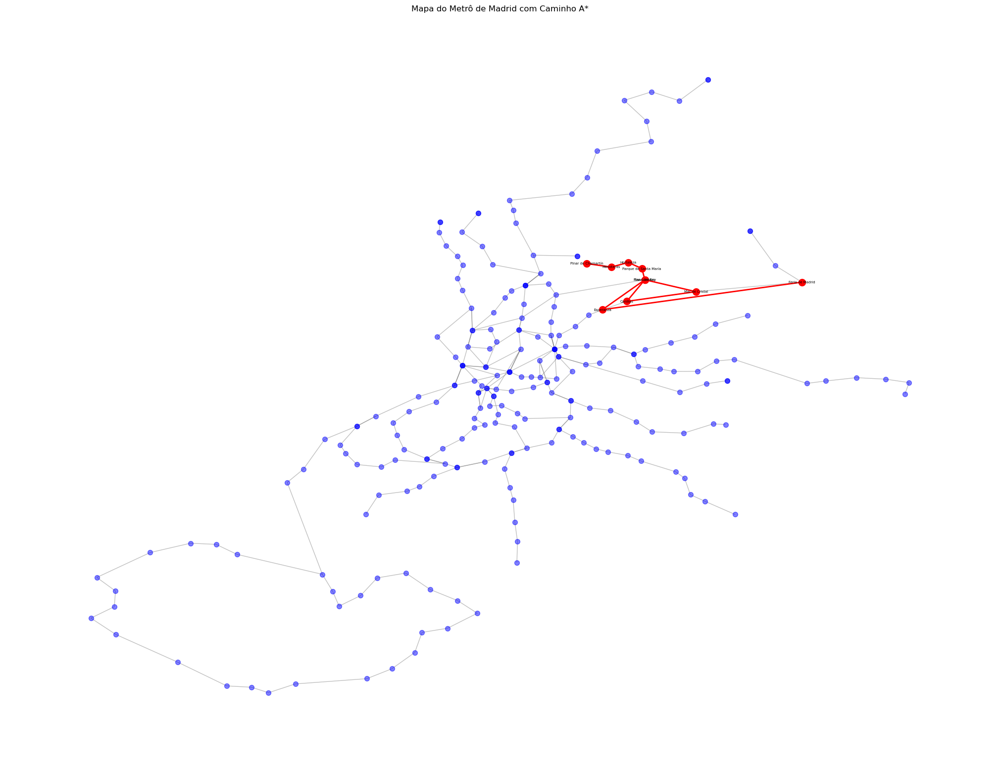

Tentativa Custo Real para Mar de Cristal : 7112.32
Tentativa Custo Real para Aeropuerto T1-T2-T3 : 9026.57
Atualizando Custo Real e Custo Estimado para Aeropuerto T1-T2-T3 :
   Custo Real: 9026.57
   Custo Estimado: 9026.706705121533
-----------------------------------------------------------------------
Explorando nó: Arturo Soria
Custo Real: 5837.93
Custo Estimado: 5837.983813797689


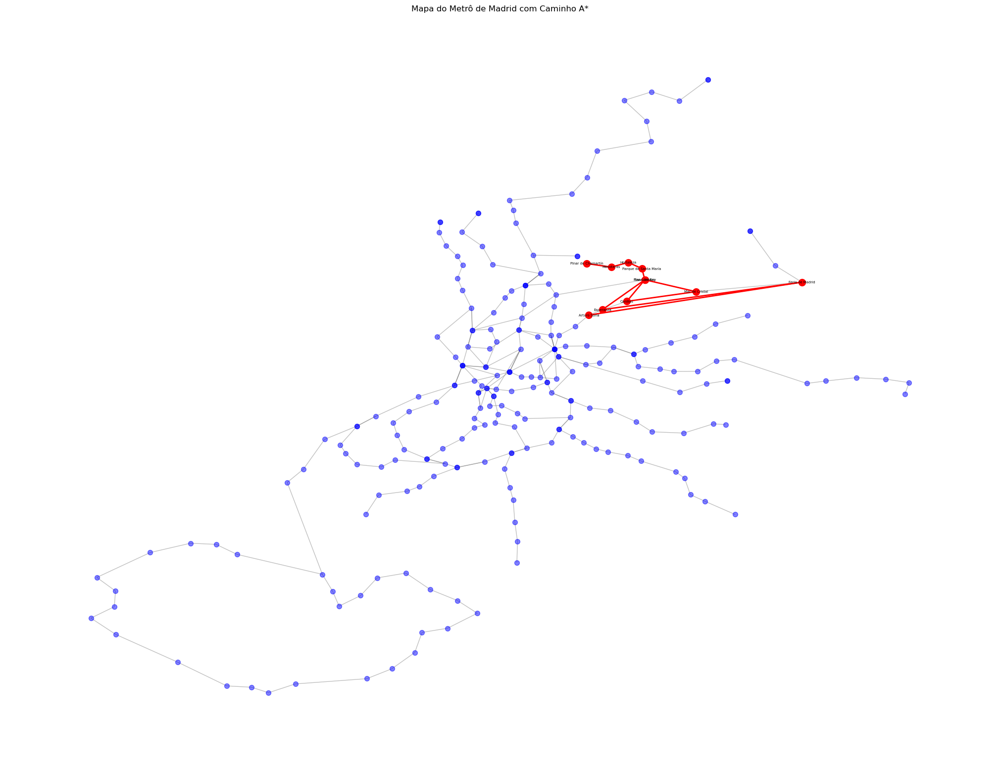

Tentativa Custo Real para Esperanza : 6813.39
Tentativa Custo Real para Avenida de la Paz : 6398.700000000001
Atualizando Custo Real e Custo Estimado para Avenida de la Paz :
   Custo Real: 6398.700000000001
   Custo Estimado: 6398.747645088765
-----------------------------------------------------------------------
Explorando nó: Avenida de la Paz
Custo Real: 6398.700000000001
Custo Estimado: 6398.747645088765


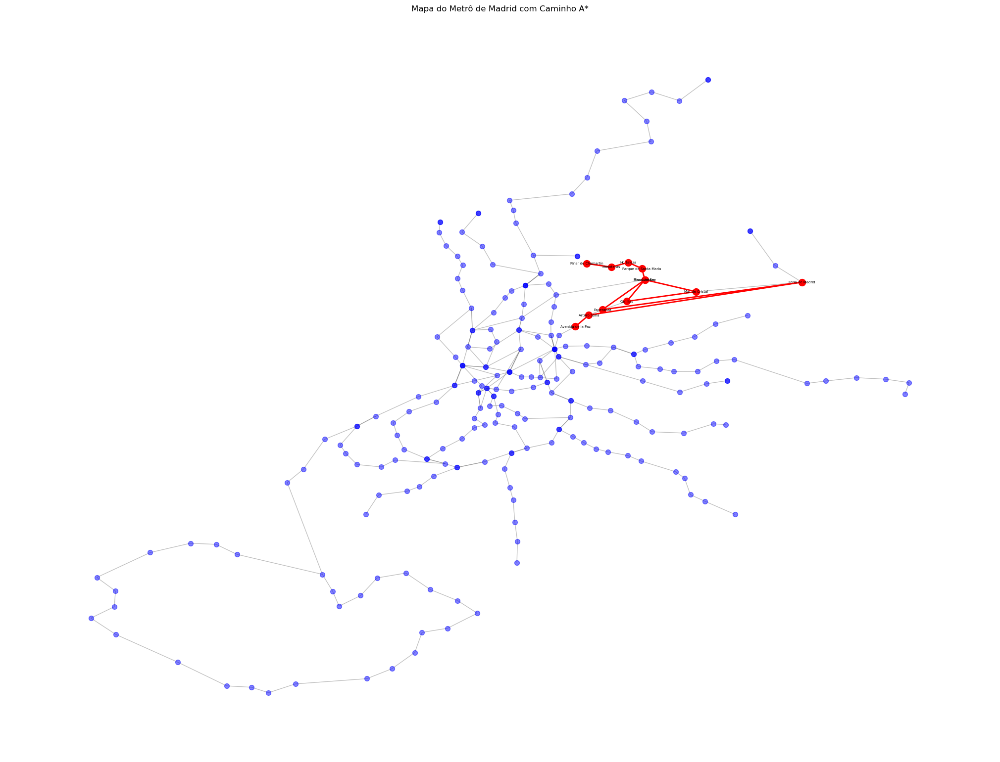

Tentativa Custo Real para Arturo Soria : 6959.470000000001
Tentativa Custo Real para Alfonso XIII : 7148.660000000001
Atualizando Custo Real e Custo Estimado para Alfonso XIII :
   Custo Real: 7148.660000000001
   Custo Estimado: 7148.700023361545
-----------------------------------------------------------------------
Explorando nó: Colombia
Custo Real: 6801.11
Custo Estimado: 6801.1494707153415


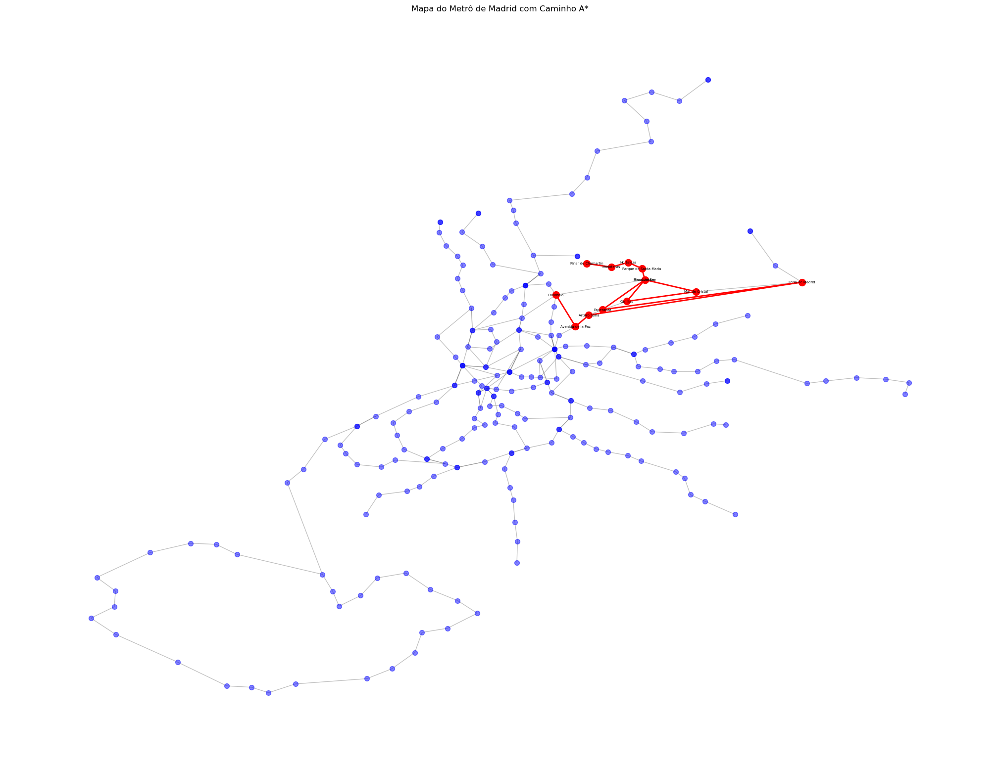

Tentativa Custo Real para Nuevos Ministerios : 8539.68
Atualizando Custo Real e Custo Estimado para Nuevos Ministerios :
   Custo Real: 8539.68
   Custo Estimado: 8539.702473661393
Tentativa Custo Real para Concha Espina : 7580.24
Atualizando Custo Real e Custo Estimado para Concha Espina :
   Custo Real: 7580.24
   Custo Estimado: 7580.273306626732
Tentativa Custo Real para Pinar del Rey : 9524.46
Tentativa Custo Real para Pío XII : 7385.95
Atualizando Custo Real e Custo Estimado para Pío XII :
   Custo Real: 7385.95
   Custo Estimado: 7385.994189446216
-----------------------------------------------------------------------
Explorando nó: Alfonso XIII
Custo Real: 7148.660000000001
Custo Estimado: 7148.700023361545


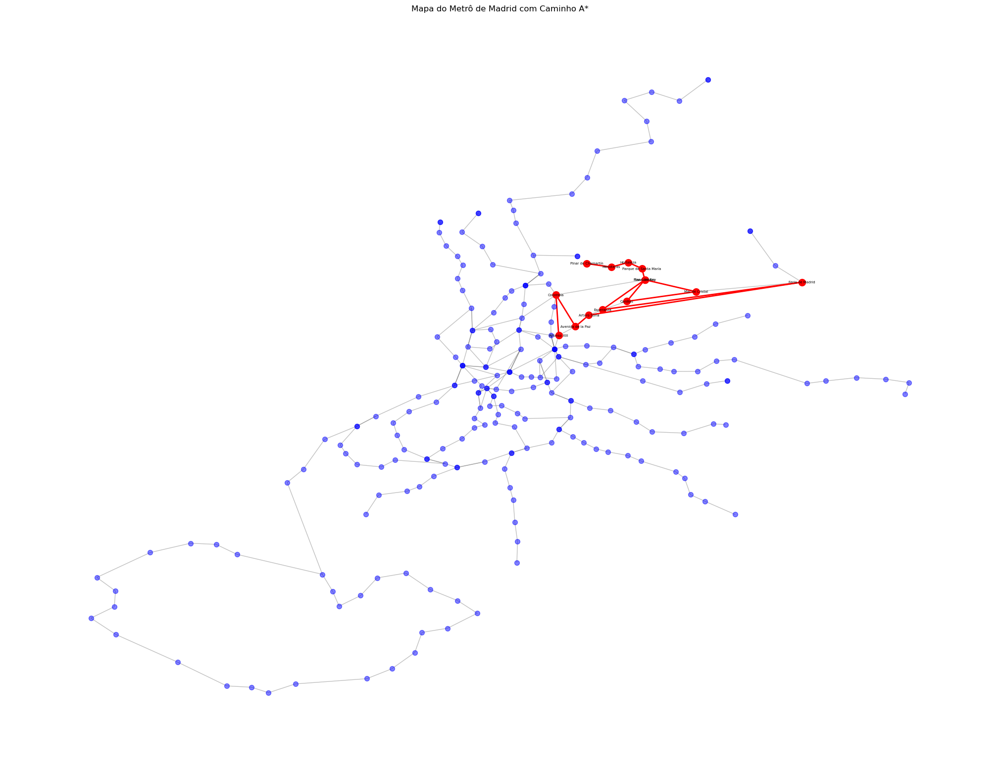

Tentativa Custo Real para Avenida de la Paz : 7898.620000000001
Tentativa Custo Real para Prosperidad : 7901.530000000001
Atualizando Custo Real e Custo Estimado para Prosperidad :
   Custo Real: 7901.530000000001
   Custo Estimado: 7901.561842652704
-----------------------------------------------------------------------
Explorando nó: Pío XII
Custo Real: 7385.95
Custo Estimado: 7385.994189446216


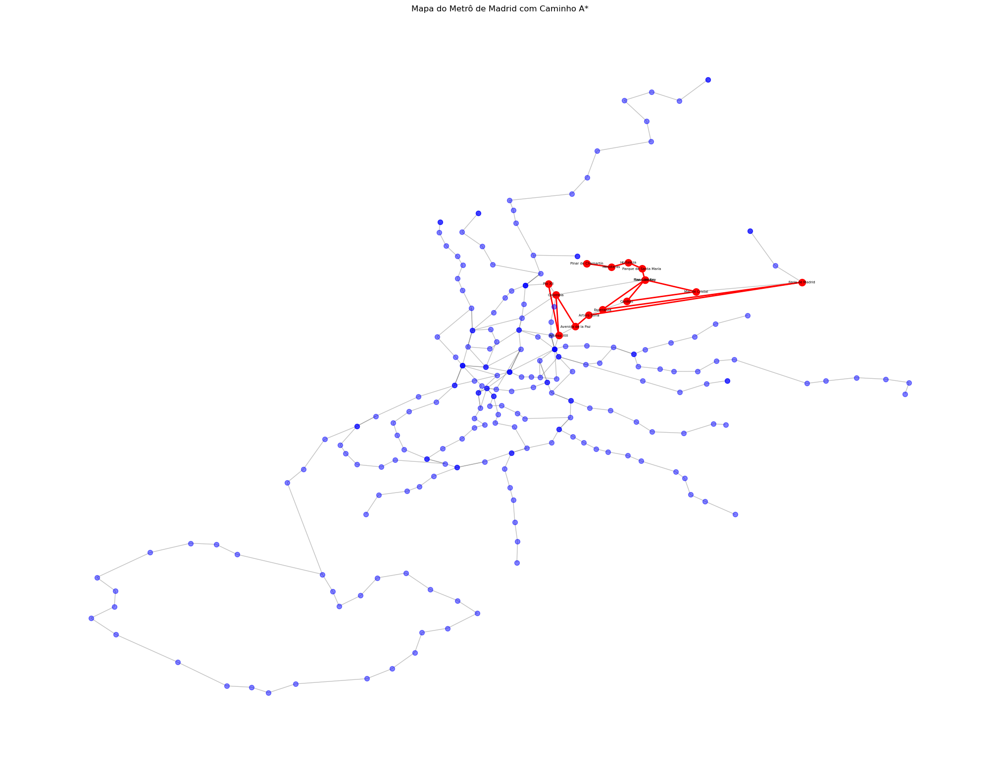

Tentativa Custo Real para Colombia : 7970.79
Tentativa Custo Real para Duque de Pastrana : 8009.01
Atualizando Custo Real e Custo Estimado para Duque de Pastrana :
   Custo Real: 8009.01
   Custo Estimado: 8009.05678289444
-----------------------------------------------------------------------
Explorando nó: Concha Espina
Custo Real: 7580.24
Custo Estimado: 7580.273306626732


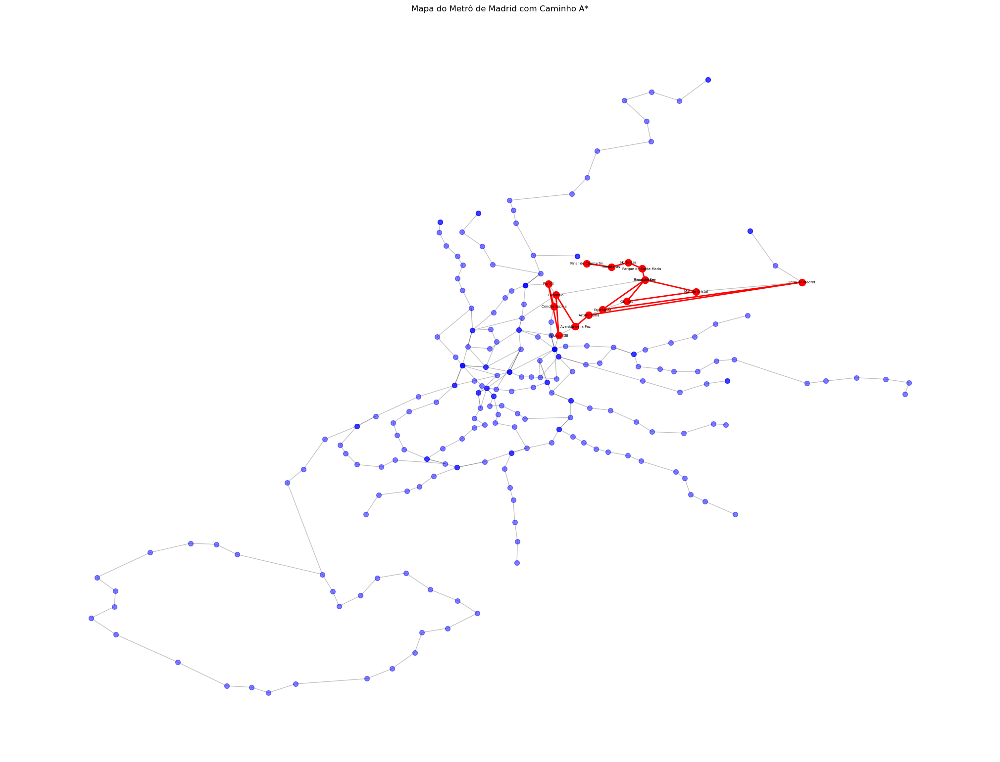

Tentativa Custo Real para Cruz del Rayo : 8263.0
Atualizando Custo Real e Custo Estimado para Cruz del Rayo :
   Custo Real: 8263.0
   Custo Estimado: 8263.029211448986
Tentativa Custo Real para Colombia : 8359.369999999999
-----------------------------------------------------------------------
Explorando nó: Prosperidad
Custo Real: 7901.530000000001
Custo Estimado: 7901.561842652704


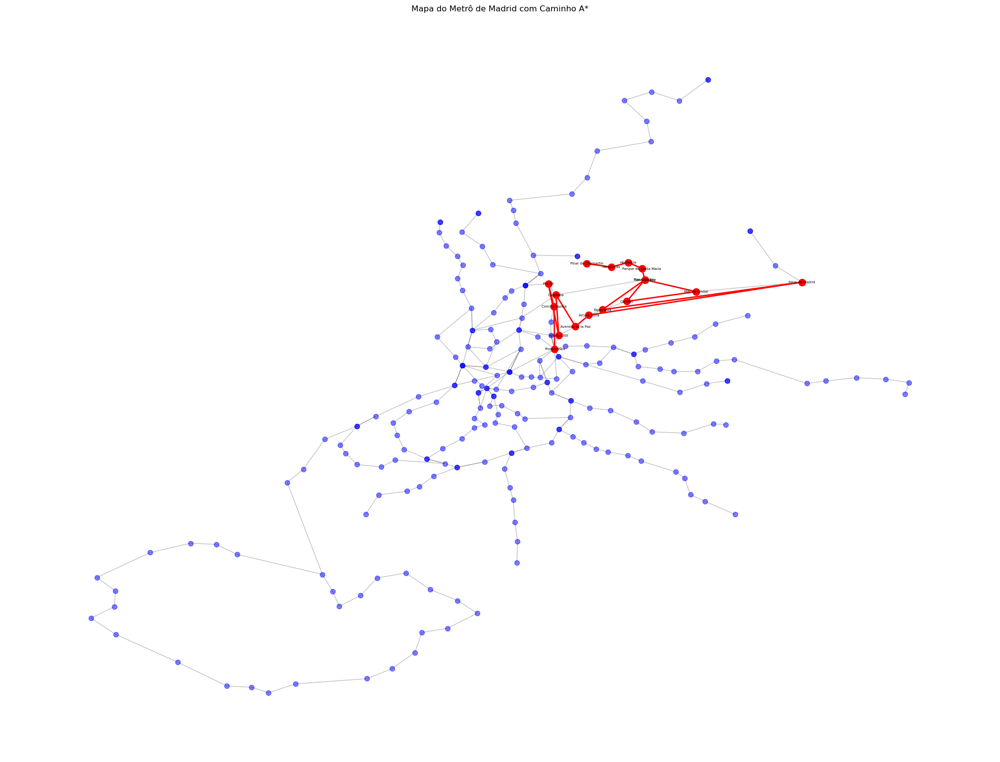

Tentativa Custo Real para Alfonso XIII : 8654.400000000001
Tentativa Custo Real para Avenida de América : 8596.730000000001
Atualizando Custo Real e Custo Estimado para Avenida de América :
   Custo Real: 8596.730000000001
   Custo Estimado: 8596.757255763614
-----------------------------------------------------------------------
Explorando nó: Duque de Pastrana
Custo Real: 8009.01
Custo Estimado: 8009.05678289444


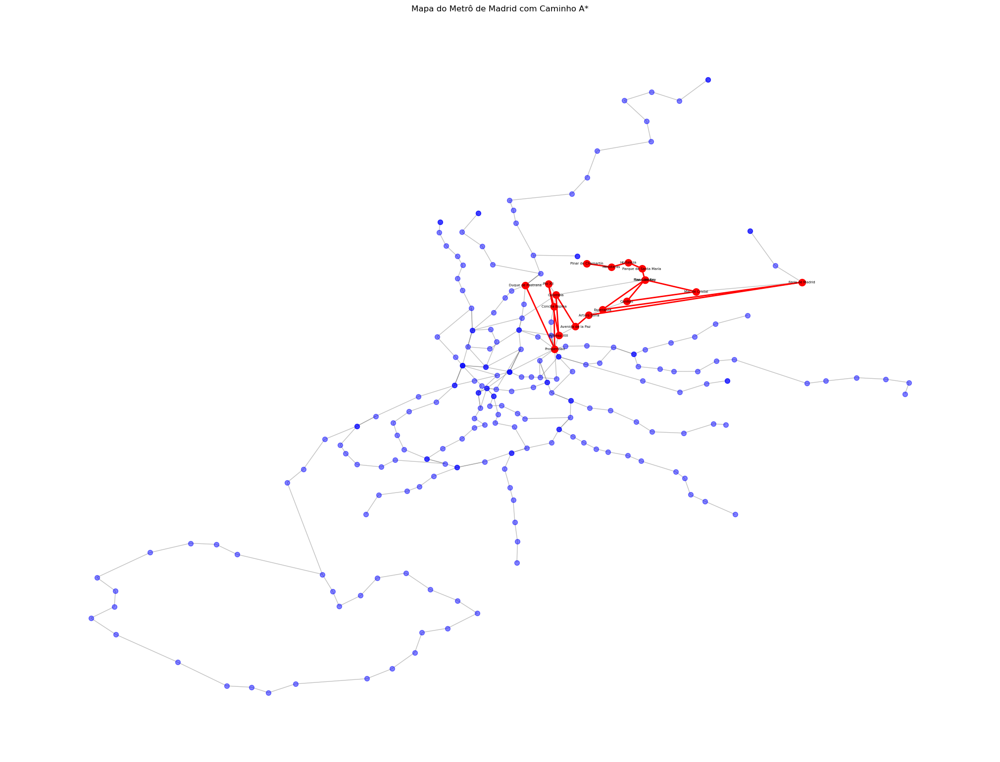

Tentativa Custo Real para Pío XII : 8632.07
Tentativa Custo Real para Plaza de Castilla : 8840.380000000001
Atualizando Custo Real e Custo Estimado para Plaza de Castilla :
   Custo Real: 8840.380000000001
   Custo Estimado: 8840.422447485902
-----------------------------------------------------------------------
Explorando nó: Cruz del Rayo
Custo Real: 8263.0
Custo Estimado: 8263.029211448986


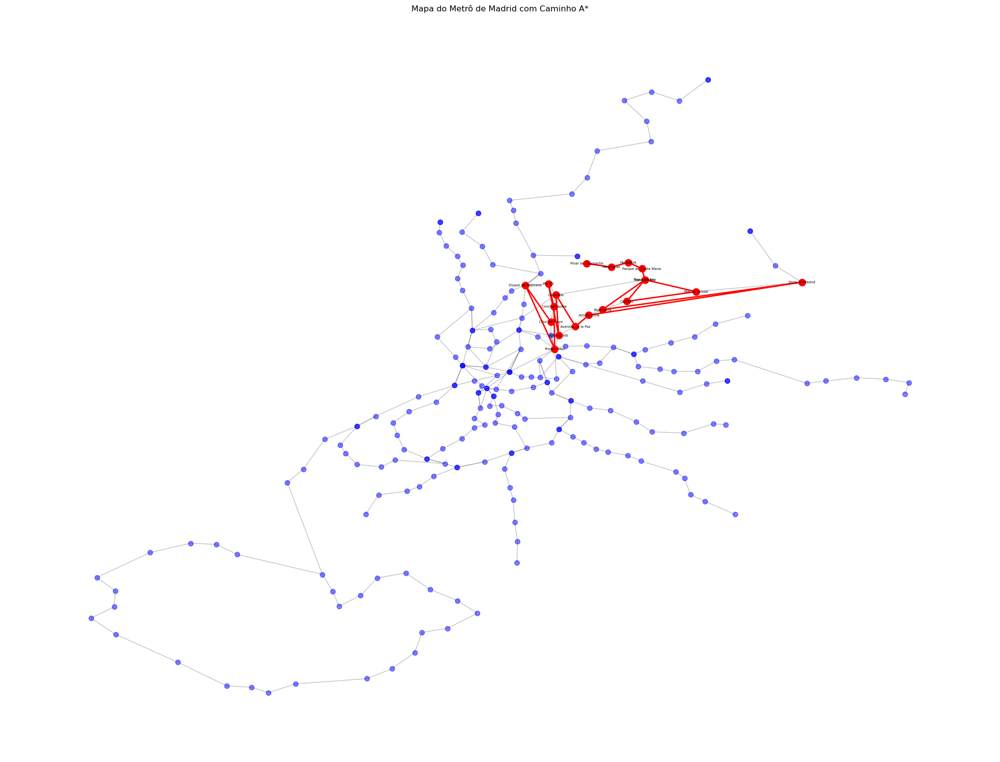

Tentativa Custo Real para Avenida de América : 8958.46
Tentativa Custo Real para Concha Espina : 8945.76
-----------------------------------------------------------------------
Explorando nó: Nuevos Ministerios
Custo Real: 8539.68
Custo Estimado: 8539.702473661393


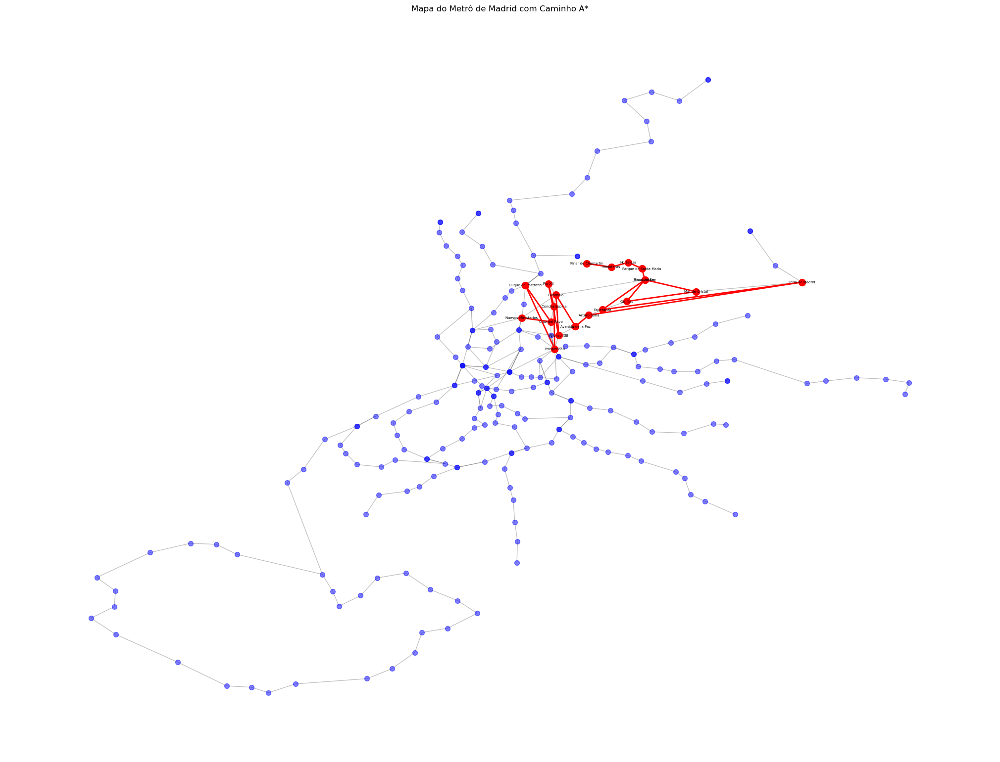

Tentativa Custo Real para República Argentina : 9296.62
Atualizando Custo Real e Custo Estimado para República Argentina :
   Custo Real: 9296.62
   Custo Estimado: 9296.64462398066
Tentativa Custo Real para Gregorio Marañón : 9495.17
Atualizando Custo Real e Custo Estimado para Gregorio Marañón :
   Custo Real: 9495.17
   Custo Estimado: 9495.185556215632
Tentativa Custo Real para Cuatro Caminos : 9555.54
Atualizando Custo Real e Custo Estimado para Cuatro Caminos :
   Custo Real: 9555.54
   Custo Estimado: 9555.56106217196
Tentativa Custo Real para Colombia : 10278.25
Tentativa Custo Real para Santiago Bernabéu : 9162.33
Atualizando Custo Real e Custo Estimado para Santiago Bernabéu :
   Custo Real: 9162.33
   Custo Estimado: 9162.358050653016
-----------------------------------------------------------------------
Explorando nó: Avenida de América
Custo Real: 8596.730000000001
Custo Estimado: 8596.757255763614


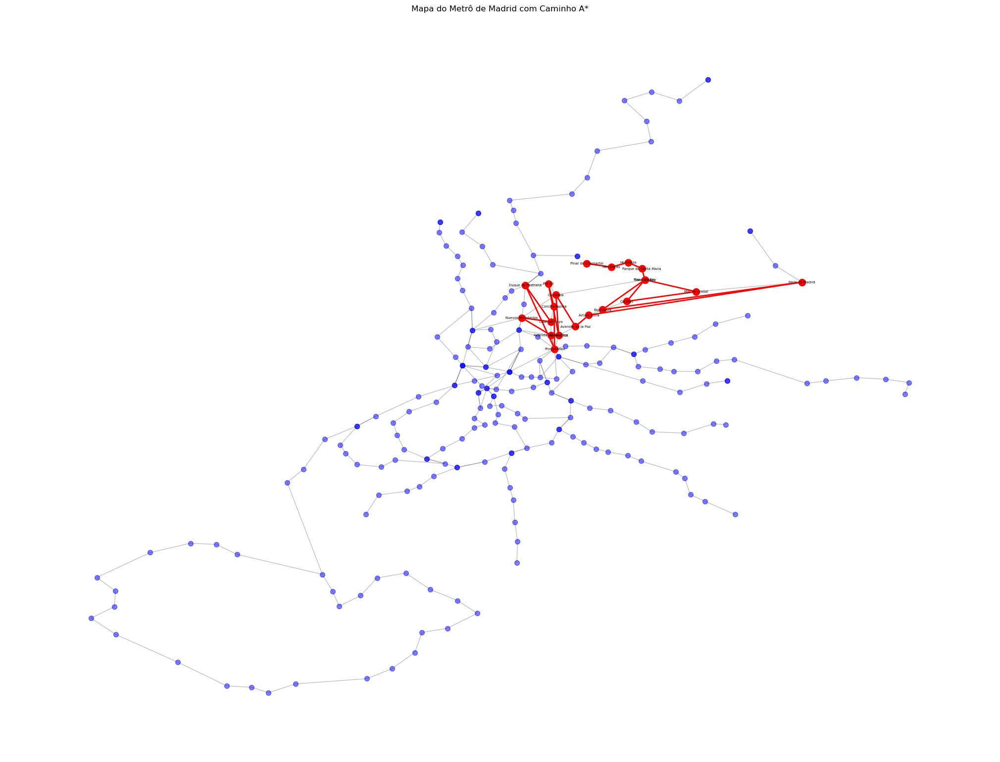

Tentativa Custo Real para Prosperidad : 9291.930000000002
Tentativa Custo Real para Cartagena : 9001.880000000001
Atualizando Custo Real e Custo Estimado para Cartagena :
   Custo Real: 9001.880000000001
   Custo Estimado: 9001.911856861312
Tentativa Custo Real para Núñez de Balboa : 9400.02
Atualizando Custo Real e Custo Estimado para Núñez de Balboa :
   Custo Real: 9400.02
   Custo Estimado: 9400.039179161924
Tentativa Custo Real para Diego de León : 9007.45
Atualizando Custo Real e Custo Estimado para Diego de León :
   Custo Real: 9007.45
   Custo Estimado: 9007.47743015166
Tentativa Custo Real para Gregorio Marañón : 9825.740000000002
Tentativa Custo Real para Cruz del Rayo : 9292.190000000002
-----------------------------------------------------------------------
Explorando nó: Plaza de Castilla
Custo Real: 8840.380000000001
Custo Estimado: 8840.422447485902


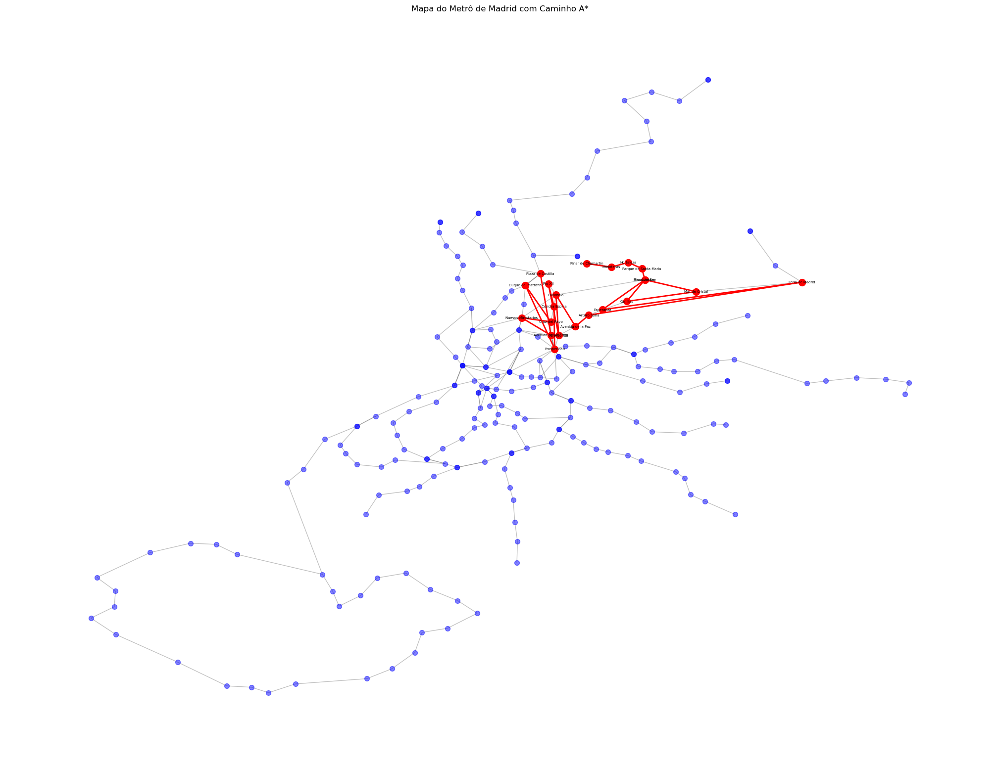

Tentativa Custo Real para Valdeacederas : 9413.79
Atualizando Custo Real e Custo Estimado para Valdeacederas :
   Custo Real: 9413.79
   Custo Estimado: 9413.828740148172
Tentativa Custo Real para Duque de Pastrana : 9671.750000000002
Tentativa Custo Real para Cuzco : 9796.62
Atualizando Custo Real e Custo Estimado para Cuzco :
   Custo Real: 9796.62
   Custo Estimado: 9796.654054696515
Tentativa Custo Real para Chamartín : 9639.410000000002
Atualizando Custo Real e Custo Estimado para Chamartín :
   Custo Real: 9639.410000000002
   Custo Estimado: 9639.459545987973
Tentativa Custo Real para Ventilla : 9484.900000000001
Atualizando Custo Real e Custo Estimado para Ventilla :
   Custo Real: 9484.900000000001
   Custo Estimado: 9484.943742487741
Tentativa Custo Real para Chamartín : 9639.410000000002
-----------------------------------------------------------------------
Explorando nó: Cartagena
Custo Real: 9001.880000000001
Custo Estimado: 9001.911856861312


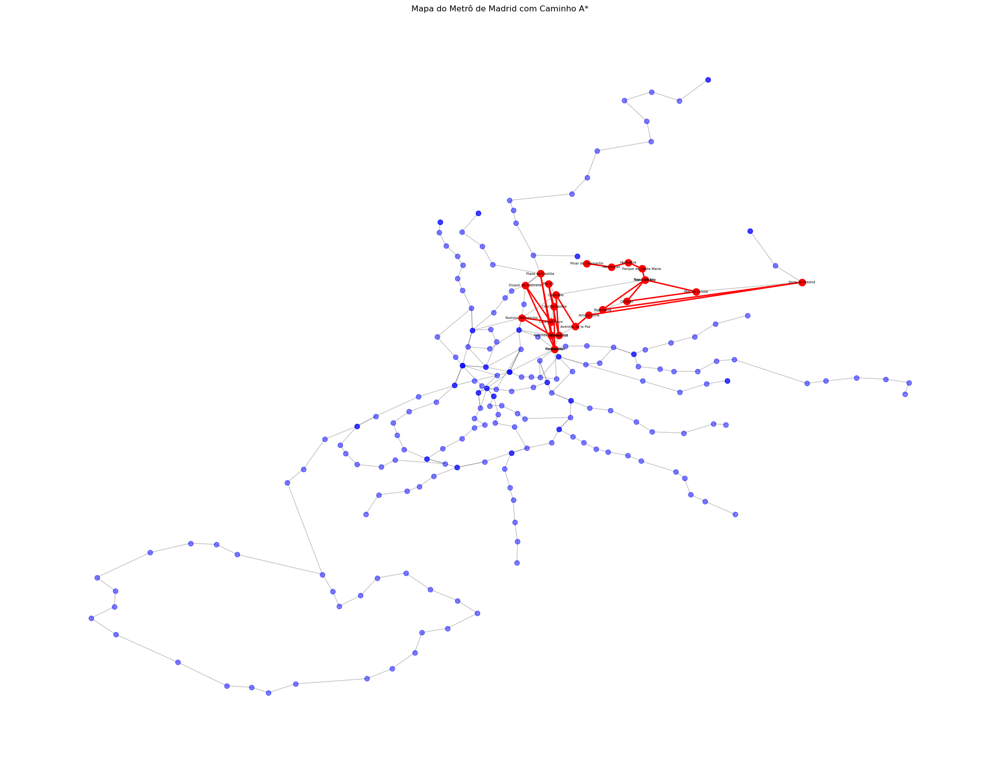

Tentativa Custo Real para Parque de las Avenidas : 9779.320000000002
Atualizando Custo Real e Custo Estimado para Parque de las Avenidas :
   Custo Real: 9779.320000000002
   Custo Estimado: 9779.360451072269
Tentativa Custo Real para Avenida de América : 9407.03
-----------------------------------------------------------------------
Explorando nó: Diego de León
Custo Real: 9007.45
Custo Estimado: 9007.47743015166


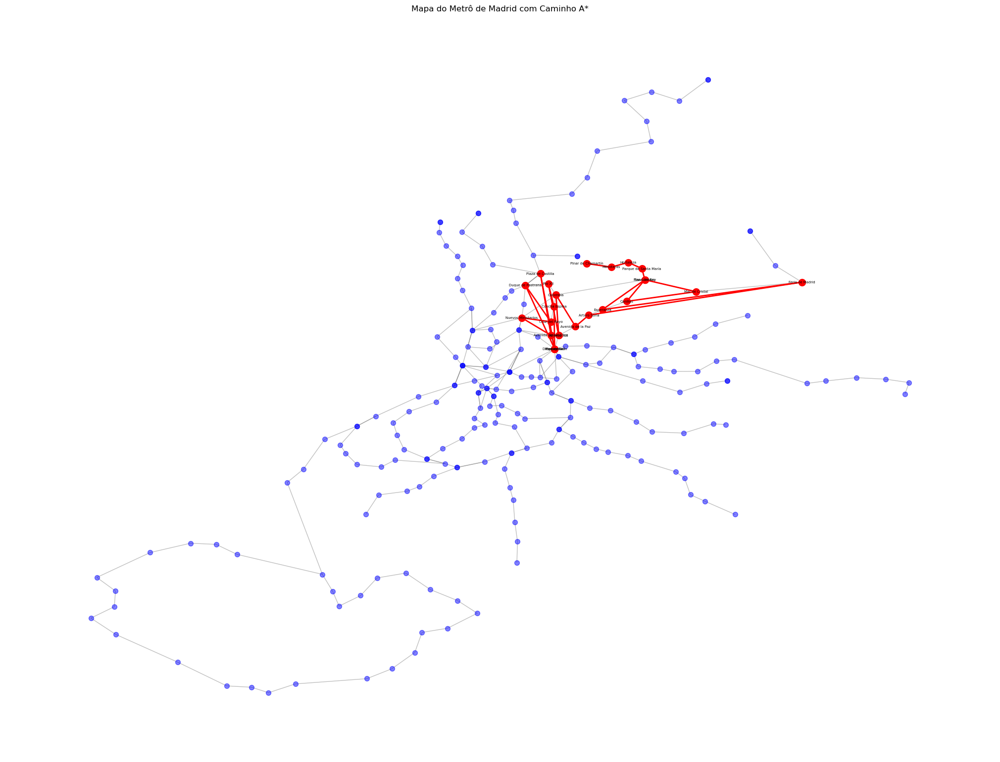

Tentativa Custo Real para Avenida de América : 9418.17
Tentativa Custo Real para Ventas : 10058.720000000001
Atualizando Custo Real e Custo Estimado para Ventas :
   Custo Real: 10058.720000000001
   Custo Estimado: 10058.75795277031
Tentativa Custo Real para Manuel Becerra : 9902.550000000001
Atualizando Custo Real e Custo Estimado para Manuel Becerra :
   Custo Real: 9902.550000000001
   Custo Estimado: 9902.582006919009
Tentativa Custo Real para Lista : 9612.34
Atualizando Custo Real e Custo Estimado para Lista :
   Custo Real: 9612.34
   Custo Estimado: 9612.365977312185
Tentativa Custo Real para Núñez de Balboa : 9722.240000000002
Tentativa Custo Real para Avenida de América	 : 9418.17
Atualizando Custo Real e Custo Estimado para Avenida de América	 :
   Custo Real: 9418.17
   Custo Estimado: 9418.197255763613
-----------------------------------------------------------------------
Explorando nó: Aeropuerto T1-T2-T3
Custo Real: 9026.57
Custo Estimado: 9026.706705121533


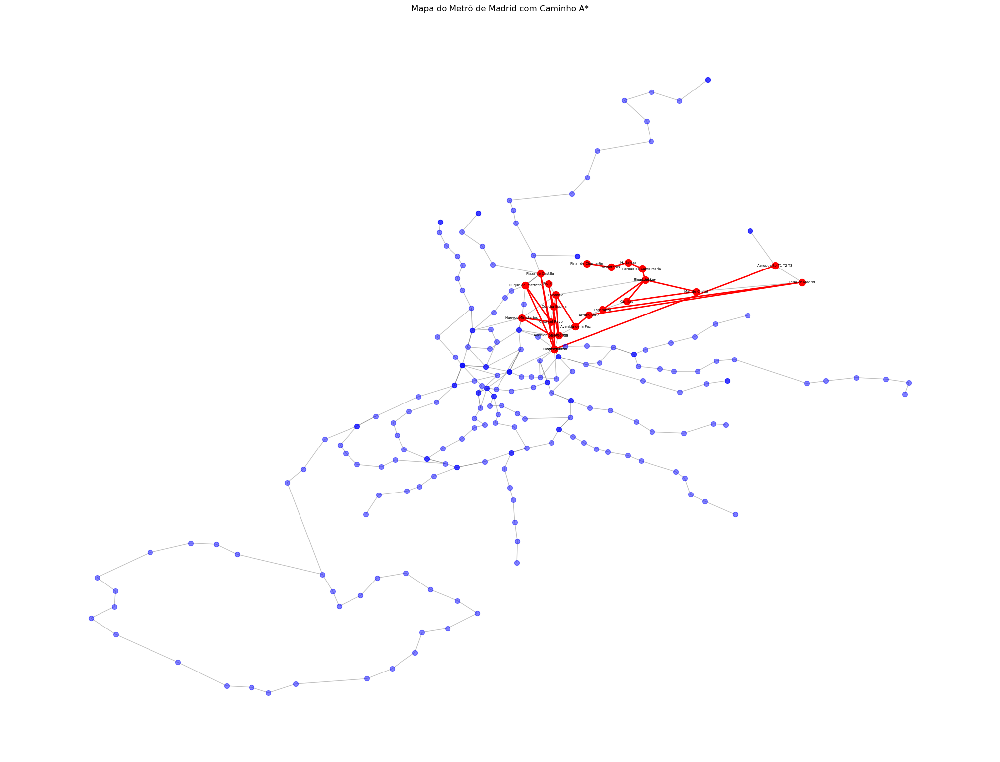

Tentativa Custo Real para Feria de Madrid : 12882.039999999999
Tentativa Custo Real para Barajas : 10309.7
Atualizando Custo Real e Custo Estimado para Barajas :
   Custo Real: 10309.7
   Custo Estimado: 10309.828555136504
-----------------------------------------------------------------------
Explorando nó: Santiago Bernabéu
Custo Real: 9162.33
Custo Estimado: 9162.358050653016


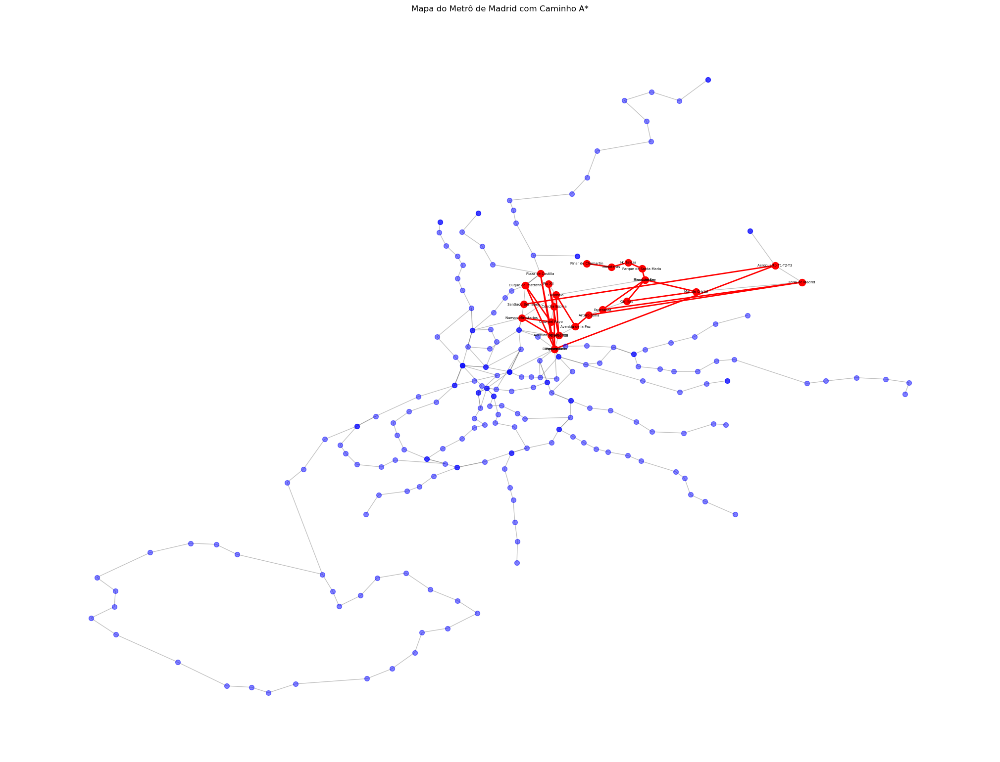

Tentativa Custo Real para Nuevos Ministerios : 9784.98
Tentativa Custo Real para Cuzco : 9844.83
-----------------------------------------------------------------------
Explorando nó: República Argentina
Custo Real: 9296.62
Custo Estimado: 9296.64462398066


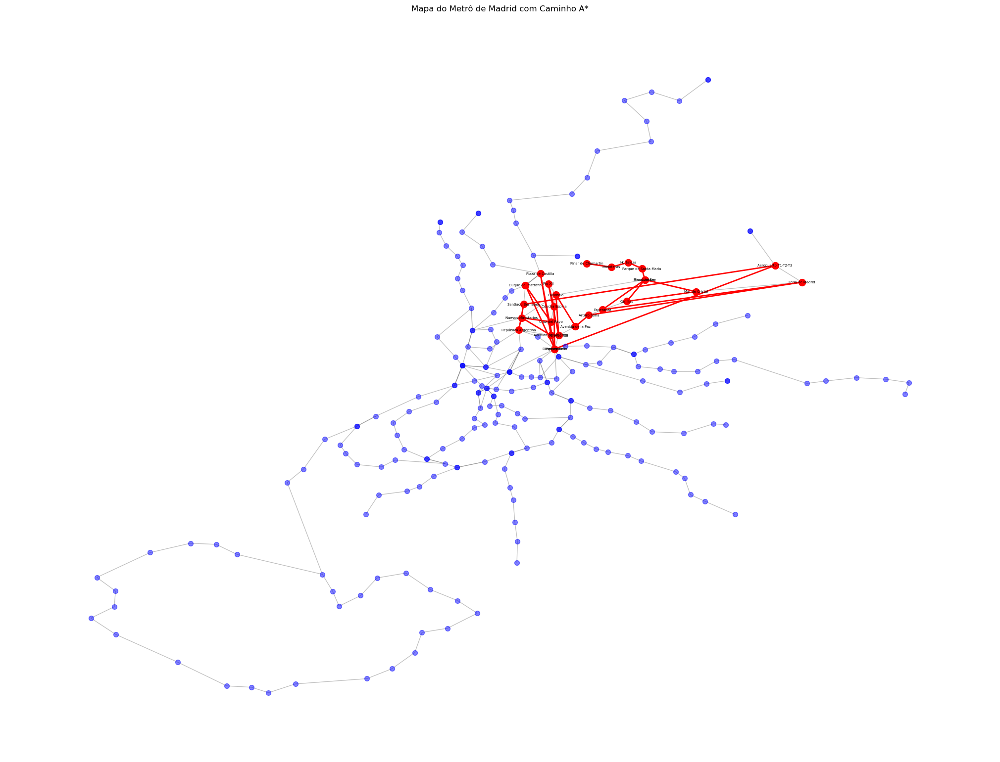

Tentativa Custo Real para Avenida de América	 : 10171.59
Tentativa Custo Real para Nuevos Ministerios : 10053.560000000001
-----------------------------------------------------------------------
Explorando nó: Núñez de Balboa
Custo Real: 9400.02
Custo Estimado: 9400.039179161924


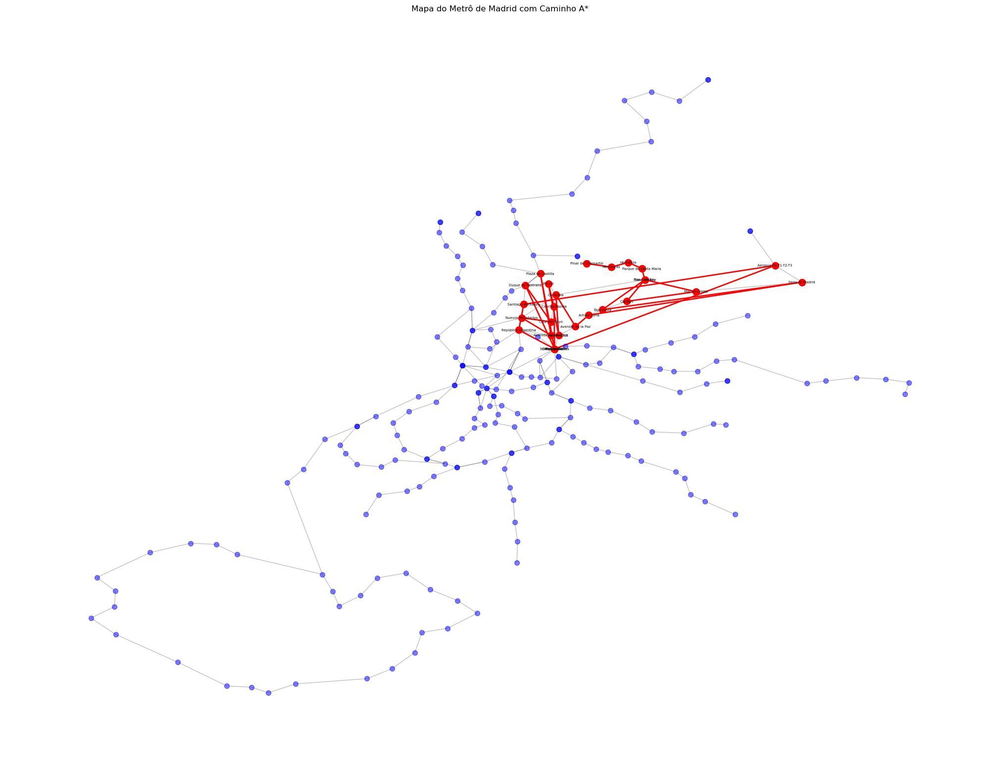

Tentativa Custo Real para Diego de León : 10114.810000000001
Tentativa Custo Real para Príncipe de Vergara : 10521.49
Atualizando Custo Real e Custo Estimado para Príncipe de Vergara :
   Custo Real: 10521.49
   Custo Estimado: 10521.511530979356
Tentativa Custo Real para Rubén Darío : 9902.42
Atualizando Custo Real e Custo Estimado para Rubén Darío :
   Custo Real: 9902.42
   Custo Estimado: 9902.43393956913
Tentativa Custo Real para Avenida de América : 10203.310000000001
-----------------------------------------------------------------------
Explorando nó: Valdeacederas
Custo Real: 9413.79
Custo Estimado: 9413.828740148172


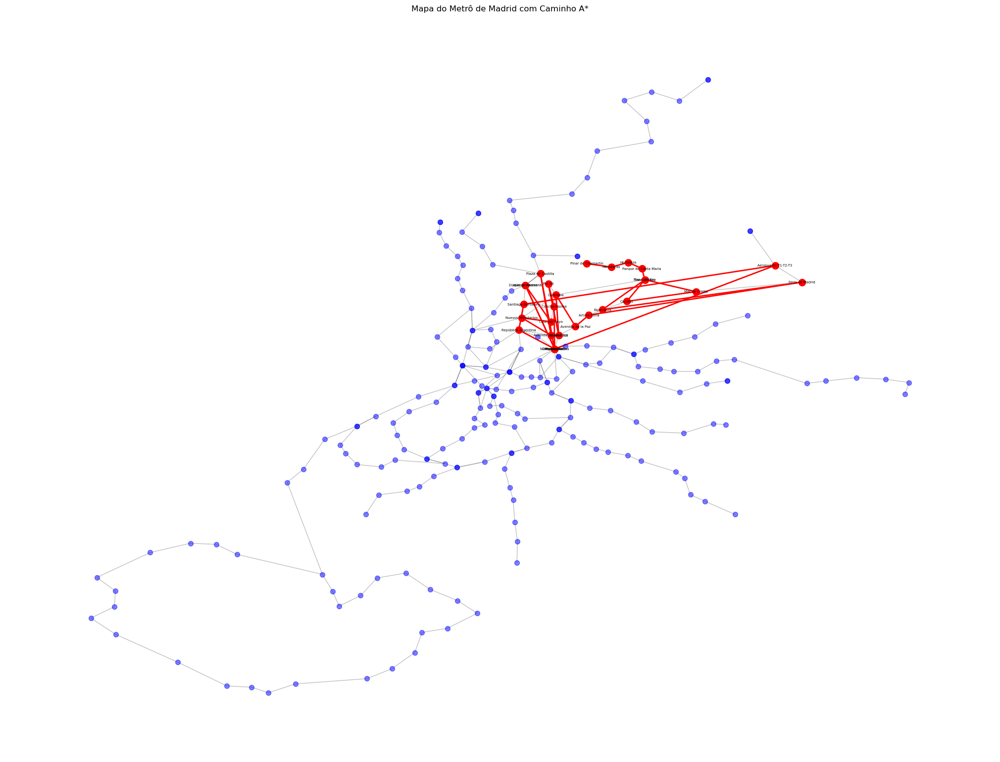

Tentativa Custo Real para Tetuán : 9836.77
Atualizando Custo Real e Custo Estimado para Tetuán :
   Custo Real: 9836.77
   Custo Estimado: 9836.80522527967
Tentativa Custo Real para Plaza de Castilla : 9987.2
-----------------------------------------------------------------------
Explorando nó: Avenida de América	
Custo Real: 9418.17
Custo Estimado: 9418.197255763613


c:\ProgramData\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


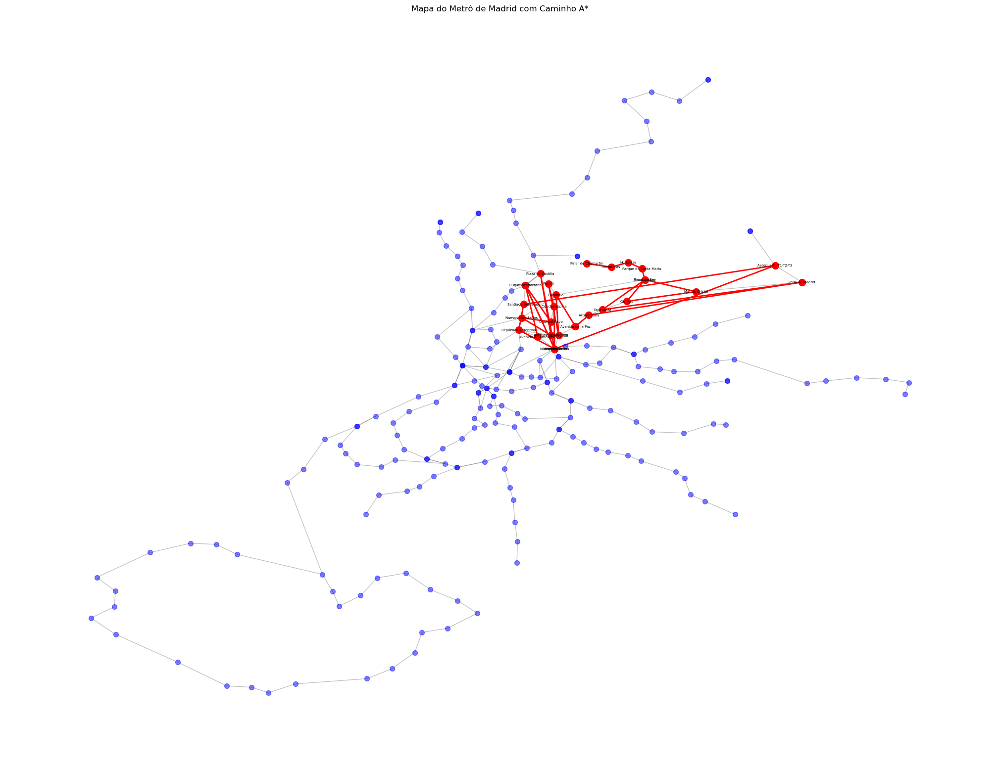

Tentativa Custo Real para Diego de León : 9828.89
Tentativa Custo Real para República Argentina : 10293.14
-----------------------------------------------------------------------
Explorando nó: Ventilla
Custo Real: 9484.900000000001
Custo Estimado: 9484.943742487741


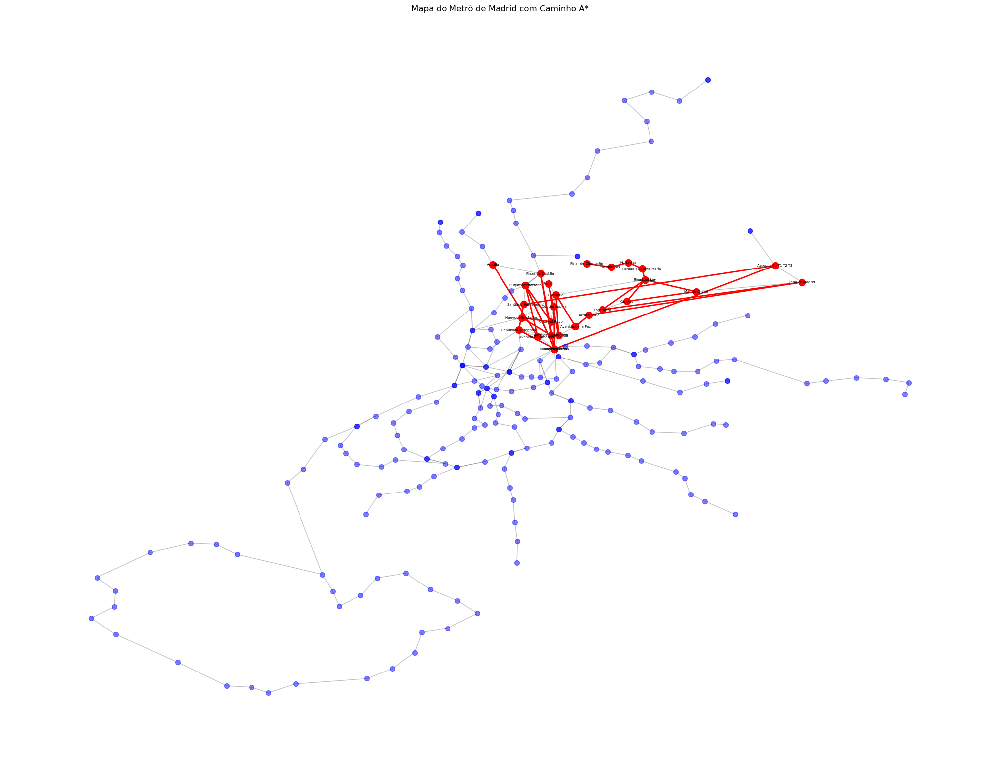

Tentativa Custo Real para Plaza de Castilla : 10129.420000000002
Tentativa Custo Real para Barrio del Pilar : 10447.04
Atualizando Custo Real e Custo Estimado para Barrio del Pilar :
   Custo Real: 10447.04
   Custo Estimado: 10447.09015483913
-----------------------------------------------------------------------
Explorando nó: Gregorio Marañón
Custo Real: 9495.17
Custo Estimado: 9495.185556215632


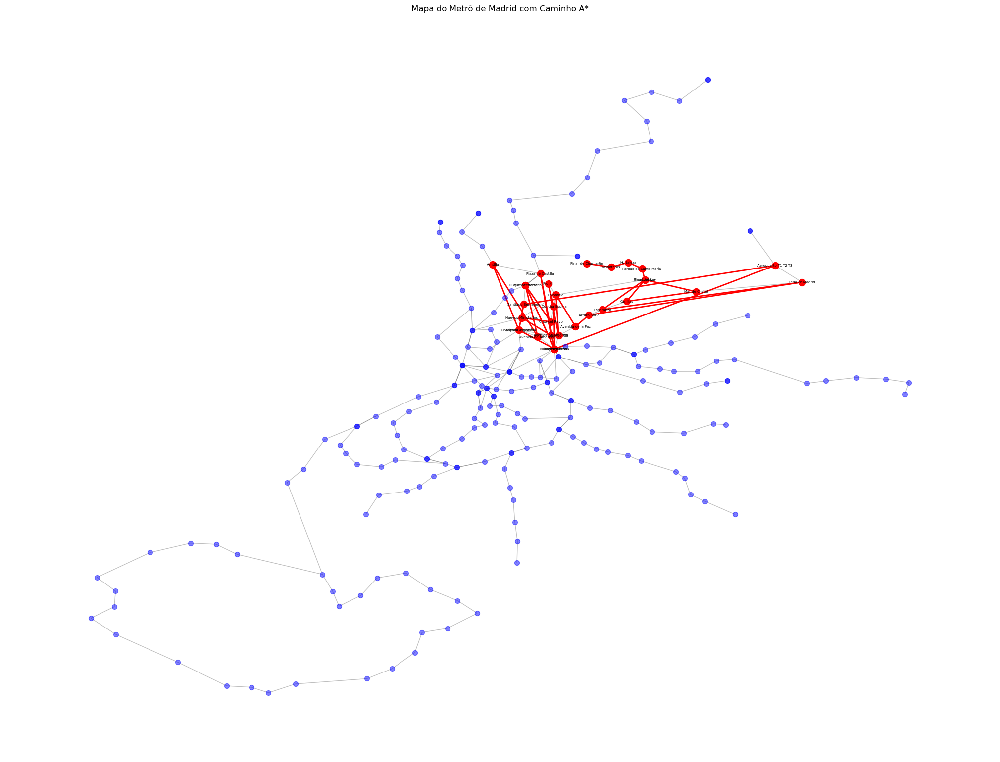

Tentativa Custo Real para Avenida de América : 10724.18
Tentativa Custo Real para Alonso Martínez : 10707.47
Atualizando Custo Real e Custo Estimado para Alonso Martínez :
   Custo Real: 10707.47
   Custo Estimado: 10707.47550317235
Tentativa Custo Real para Alonso Cano : 10182.77
Atualizando Custo Real e Custo Estimado para Alonso Cano :
   Custo Real: 10182.77
   Custo Estimado: 10182.782440275363
Tentativa Custo Real para Nuevos Ministerios : 10450.66
-----------------------------------------------------------------------
Explorando nó: Cuatro Caminos
Custo Real: 9555.54
Custo Estimado: 9555.56106217196


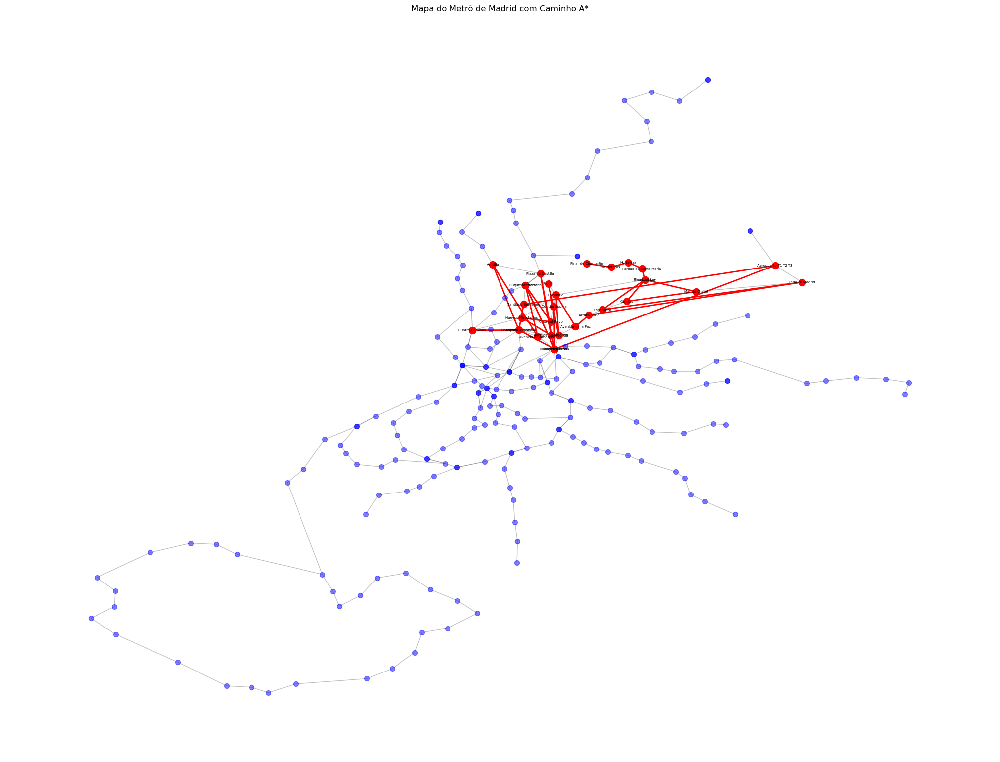

Tentativa Custo Real para Ríos Rosas : 10217.04
Atualizando Custo Real e Custo Estimado para Ríos Rosas :
   Custo Real: 10217.04
   Custo Estimado: 10217.055227408002
Tentativa Custo Real para Moncloa : 11443.070000000002
Atualizando Custo Real e Custo Estimado para Moncloa :
   Custo Real: 11443.070000000002
   Custo Estimado: 11443.089826481939
Tentativa Custo Real para Nuevos Ministerios : 10571.400000000001
Tentativa Custo Real para Alvarado : 9913.650000000001
Atualizando Custo Real e Custo Estimado para Alvarado :
   Custo Real: 9913.650000000001
   Custo Estimado: 9913.674187425051
Tentativa Custo Real para Canal : 10533.650000000001
Atualizando Custo Real e Custo Estimado para Canal :
   Custo Real: 10533.650000000001
   Custo Estimado: 10533.662491236026
Tentativa Custo Real para Guzmán el Bueno : 10220.320000000002
Atualizando Custo Real e Custo Estimado para Guzmán el Bueno :
   Custo Real: 10220.320000000002
   Custo Estimado: 10220.343010116745
---------------------------

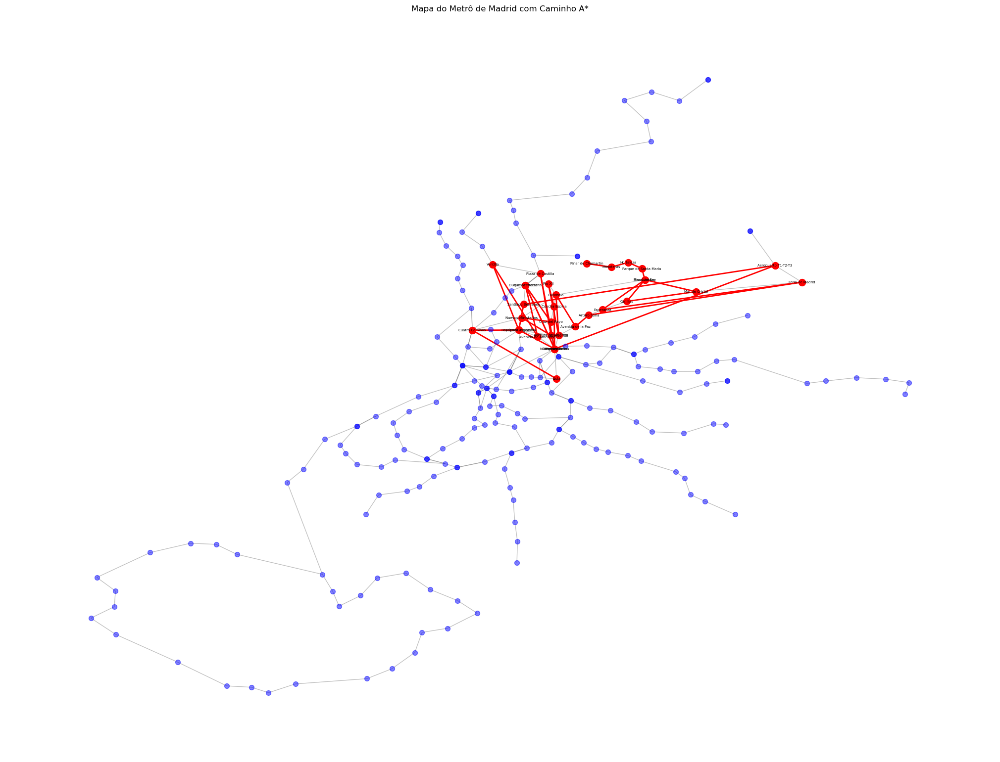

Tentativa Custo Real para Diego de León : 10217.23
Tentativa Custo Real para Goya : 10124.83
Atualizando Custo Real e Custo Estimado para Goya :
   Custo Real: 10124.83
   Custo Estimado: 10124.85535371065
-----------------------------------------------------------------------
Explorando nó: Chamartín
Custo Real: 9639.410000000002
Custo Estimado: 9639.459545987973


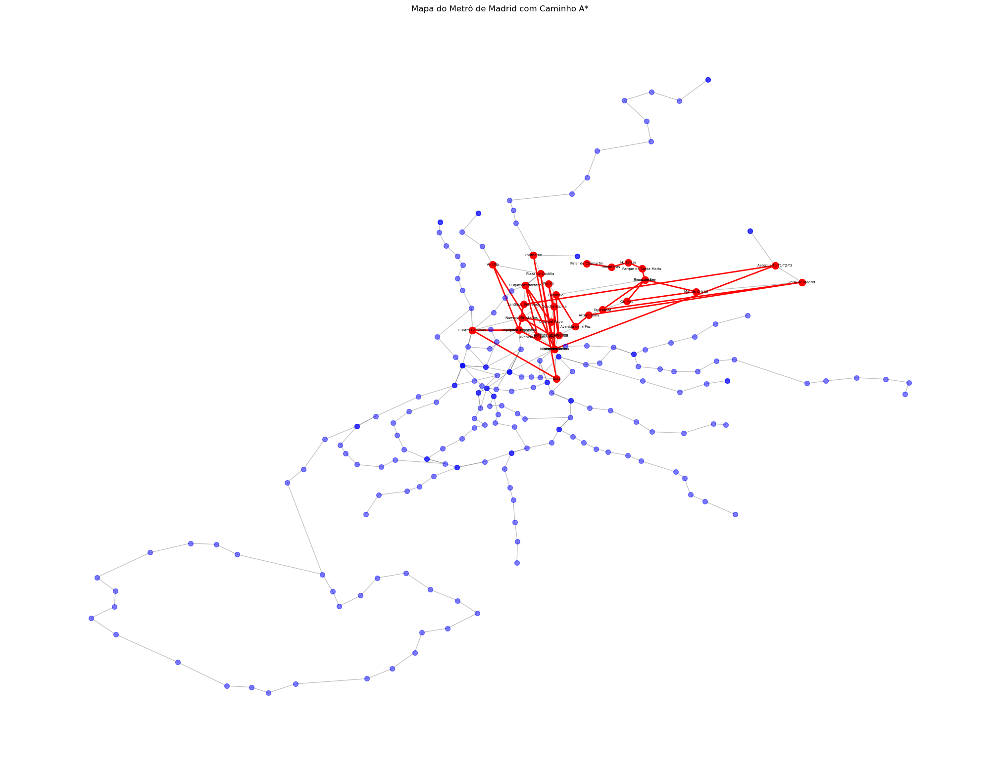

Tentativa Custo Real para Plaza de Castilla : 10438.440000000002
Tentativa Custo Real para Plaza de Castilla : 10438.440000000002
Tentativa Custo Real para Bambú : 10394.120000000003
Atualizando Custo Real e Custo Estimado para Bambú :
   Custo Real: 10394.120000000003
   Custo Estimado: 10394.176470148117
Tentativa Custo Real para Begoña : 10599.730000000001
Atualizando Custo Real e Custo Estimado para Begoña :
   Custo Real: 10599.730000000001
   Custo Estimado: 10599.786476405654
-----------------------------------------------------------------------
Explorando nó: Parque de las Avenidas
Custo Real: 9779.320000000002
Custo Estimado: 9779.360451072269


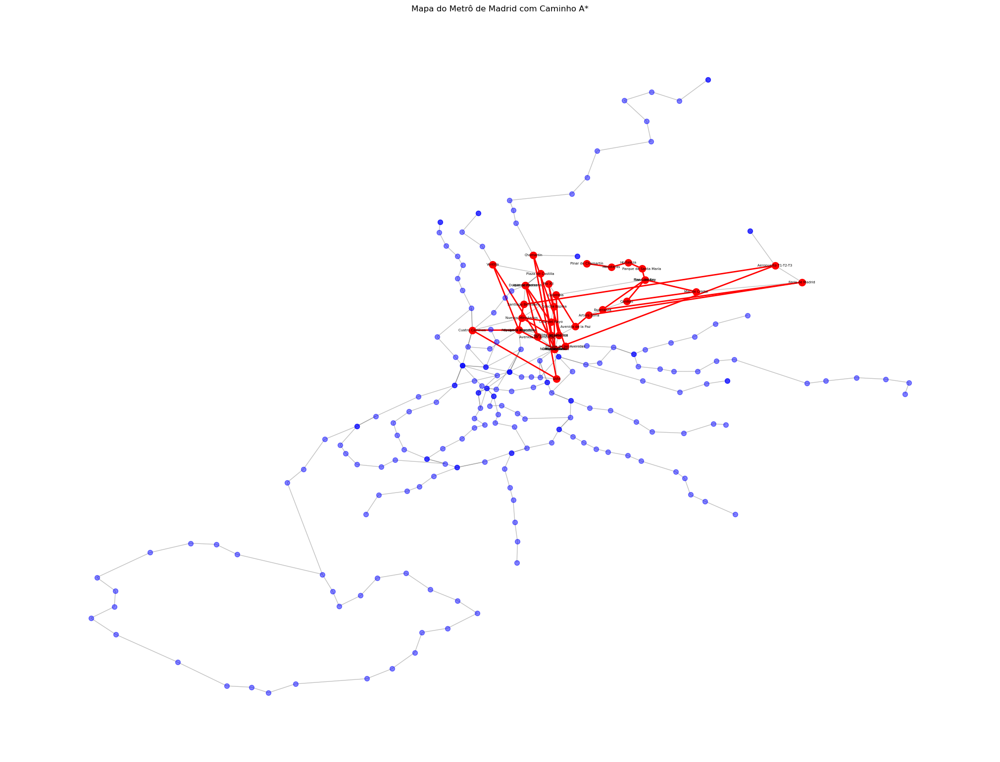

Tentativa Custo Real para Barrio de la Concepción : 10744.250000000002
Atualizando Custo Real e Custo Estimado para Barrio de la Concepción :
   Custo Real: 10744.250000000002
   Custo Estimado: 10744.30116702791
Tentativa Custo Real para Cartagena : 10556.760000000002
-----------------------------------------------------------------------
Explorando nó: Cuzco
Custo Real: 9796.62
Custo Estimado: 9796.654054696515


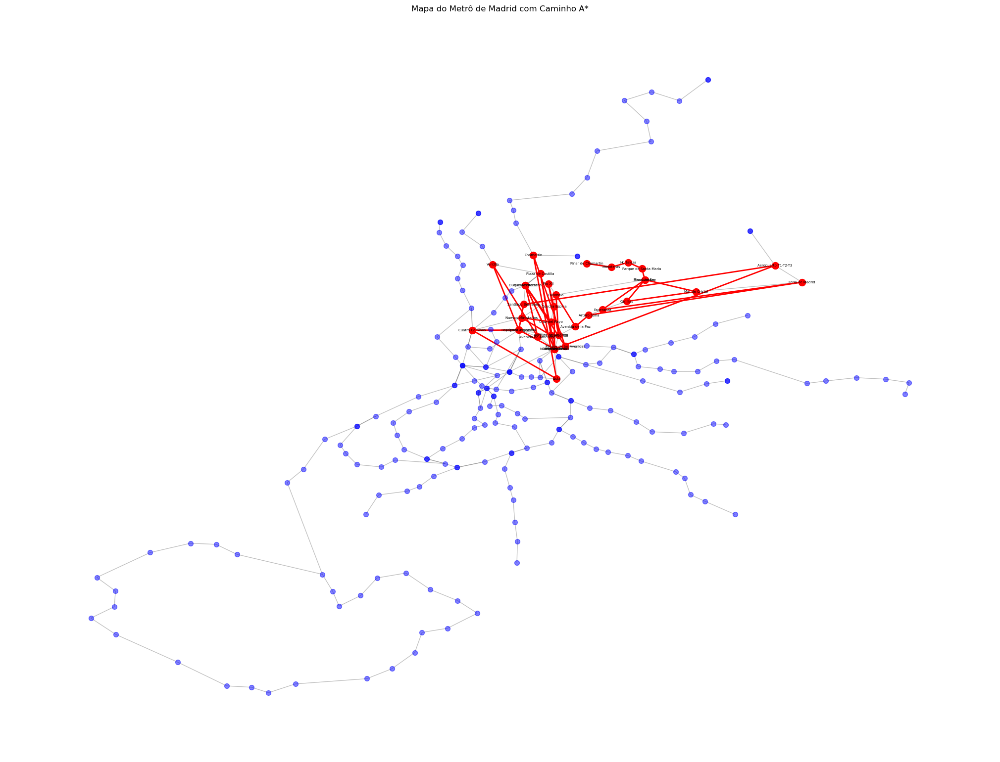

Tentativa Custo Real para Santiago Bernabéu : 10479.12
Tentativa Custo Real para Plaza de Castilla : 10752.86
-----------------------------------------------------------------------
Explorando nó: Tetuán
Custo Real: 9836.77
Custo Estimado: 9836.80522527967


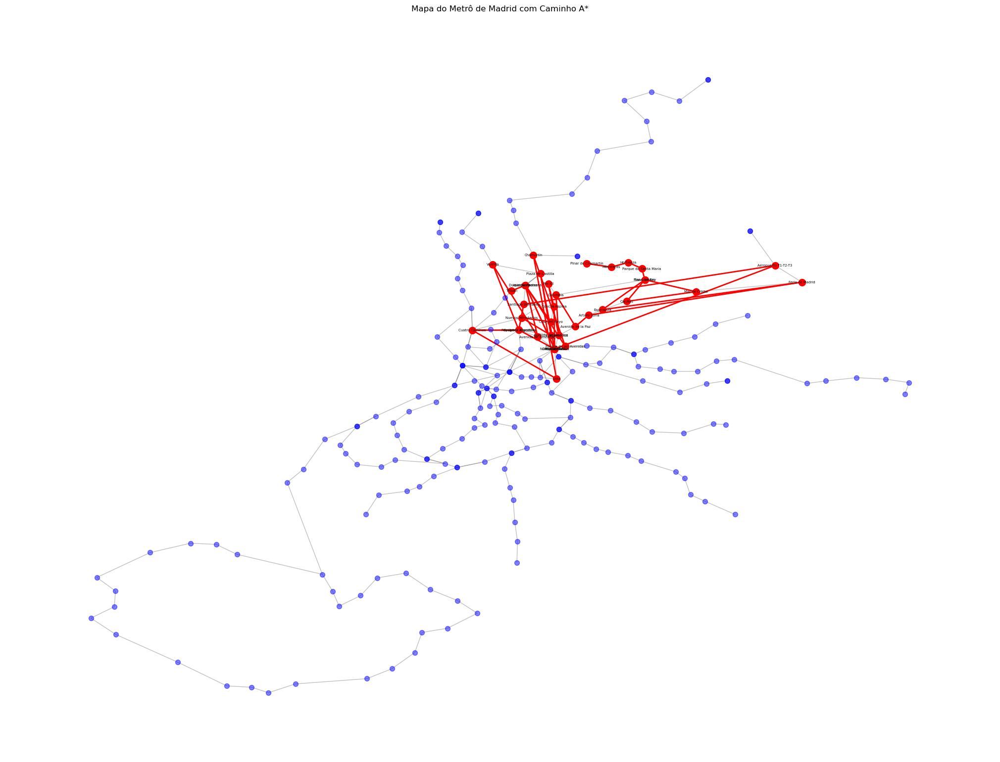

Tentativa Custo Real para Estrecho : 10683.9
Atualizando Custo Real e Custo Estimado para Estrecho :
   Custo Real: 10683.9
   Custo Estimado: 10683.928483962272
Tentativa Custo Real para Valdeacederas : 10259.75
-----------------------------------------------------------------------
Explorando nó: Rubén Darío
Custo Real: 9902.42
Custo Estimado: 9902.43393956913


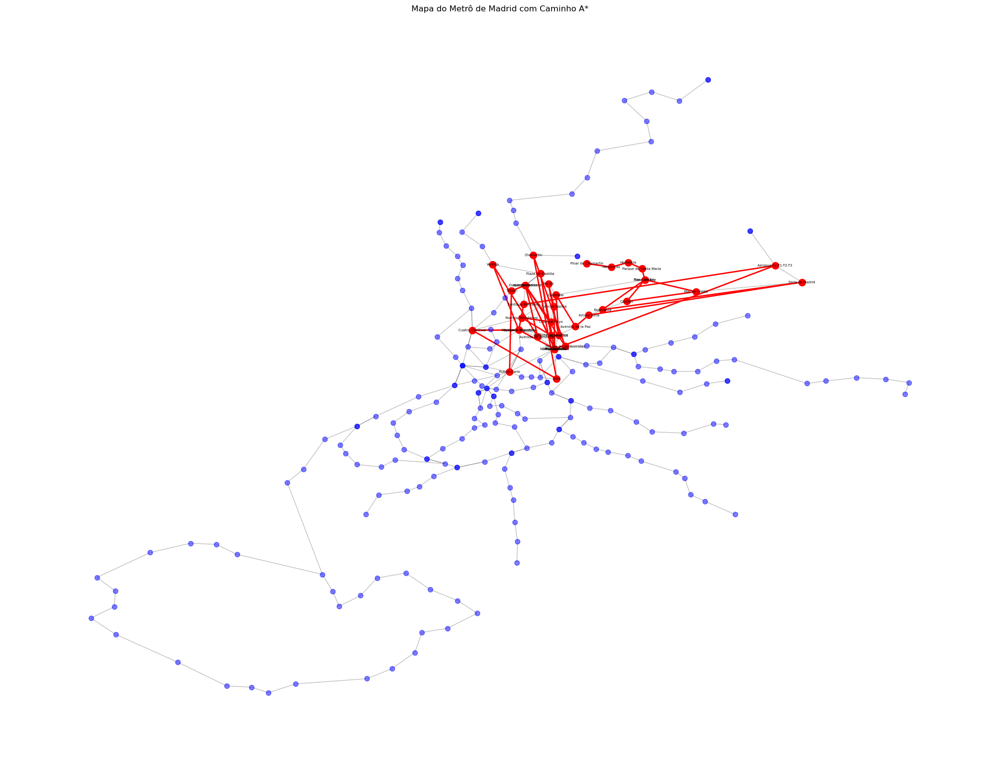

Tentativa Custo Real para Núñez de Balboa : 10404.82
Tentativa Custo Real para Alonso Martínez : 10731.47
-----------------------------------------------------------------------
Explorando nó: Manuel Becerra
Custo Real: 9902.550000000001
Custo Estimado: 9902.582006919009


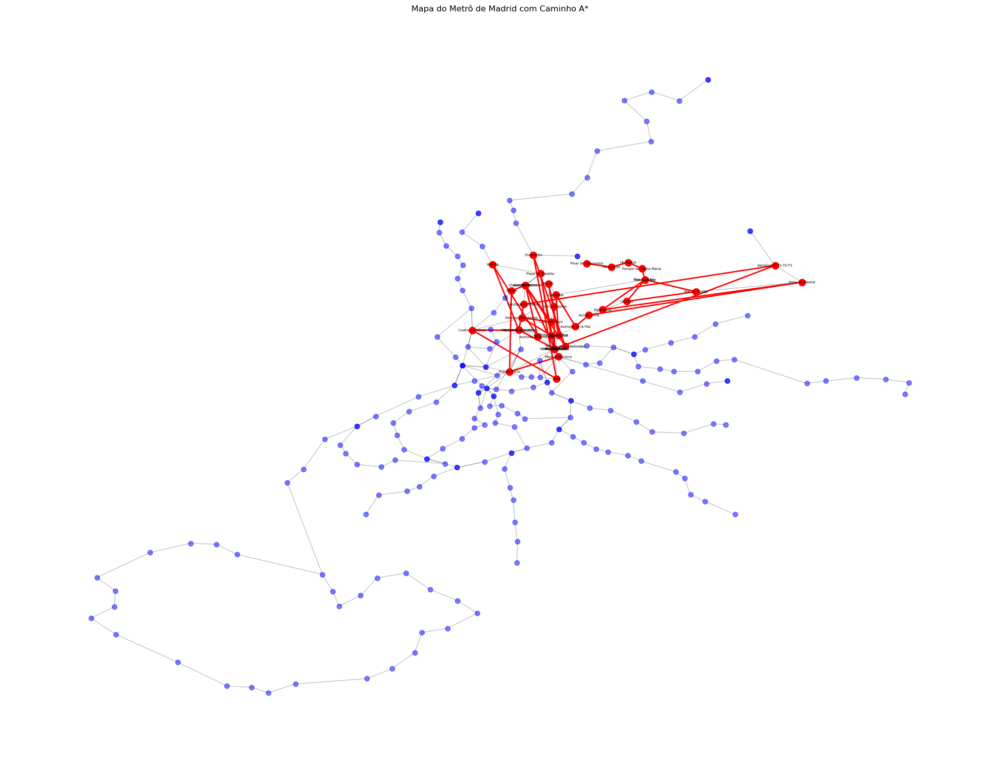

Tentativa Custo Real para Goya : 10576.580000000002
Tentativa Custo Real para O'Donnell : 10513.18
Atualizando Custo Real e Custo Estimado para O'Donnell :
   Custo Real: 10513.18
   Custo Estimado: 10513.212399750397
Tentativa Custo Real para Ventas : 10499.490000000002
Tentativa Custo Real para Diego de León : 10797.650000000001
-----------------------------------------------------------------------
Explorando nó: Alvarado
Custo Real: 9913.650000000001
Custo Estimado: 9913.674187425051


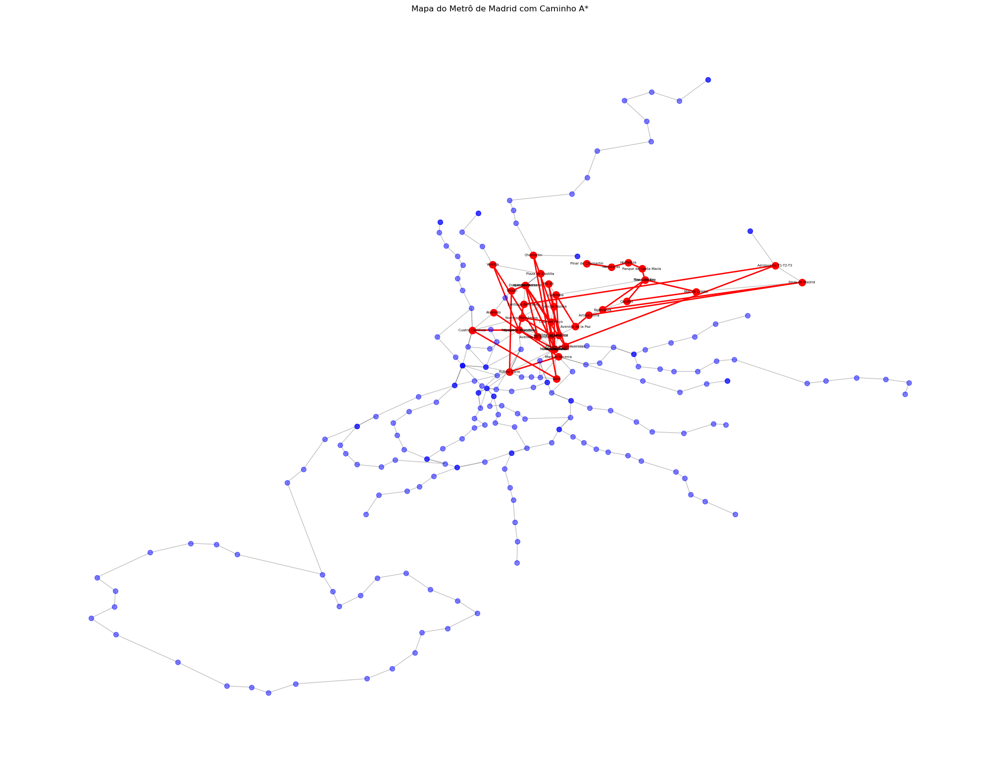

Tentativa Custo Real para Cuatro Caminos : 10271.760000000002
Tentativa Custo Real para Estrecho : 10403.04
Atualizando Custo Real e Custo Estimado para Estrecho :
   Custo Real: 10403.04
   Custo Estimado: 10403.068483962274
-----------------------------------------------------------------------
Explorando nó: Ventas
Custo Real: 10058.720000000001
Custo Estimado: 10058.75795277031


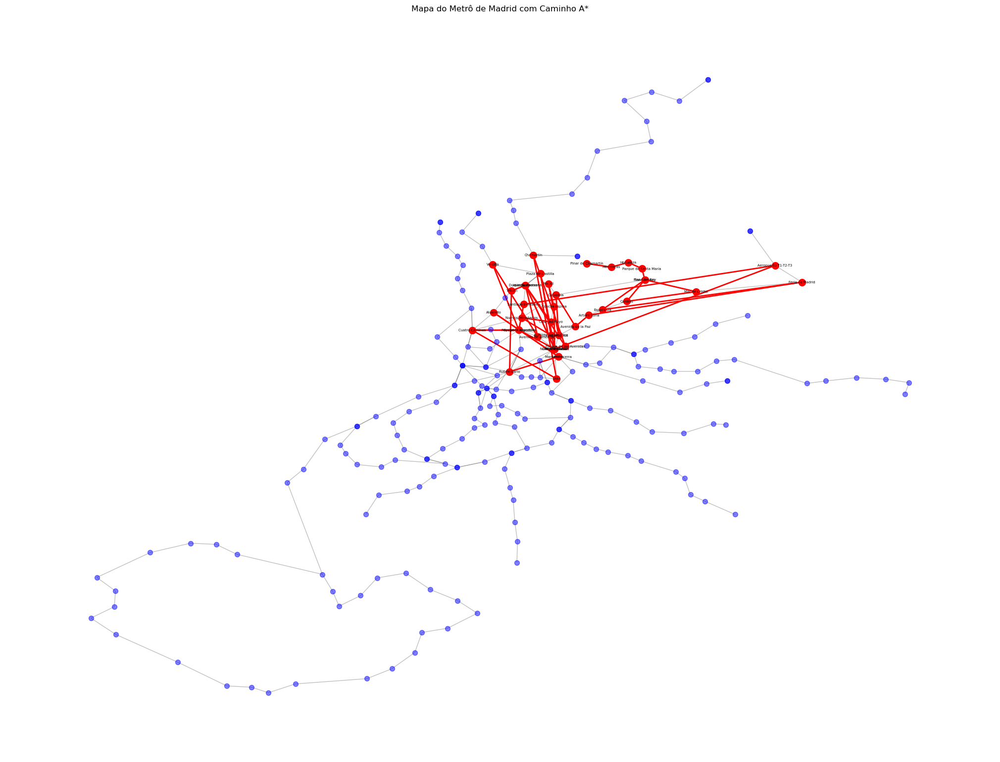

Tentativa Custo Real para Manuel Becerra : 10655.660000000002
Tentativa Custo Real para El Carmen : 10577.240000000002
Atualizando Custo Real e Custo Estimado para El Carmen :
   Custo Real: 10577.240000000002
   Custo Estimado: 10577.284046728011
Tentativa Custo Real para La Elipa : 11266.11
Atualizando Custo Real e Custo Estimado para La Elipa :
   Custo Real: 11266.11
   Custo Estimado: 11266.160544954339
Tentativa Custo Real para Diego de León : 11109.990000000002
-----------------------------------------------------------------------
Explorando nó: Goya
Custo Real: 10124.83
Custo Estimado: 10124.85535371065


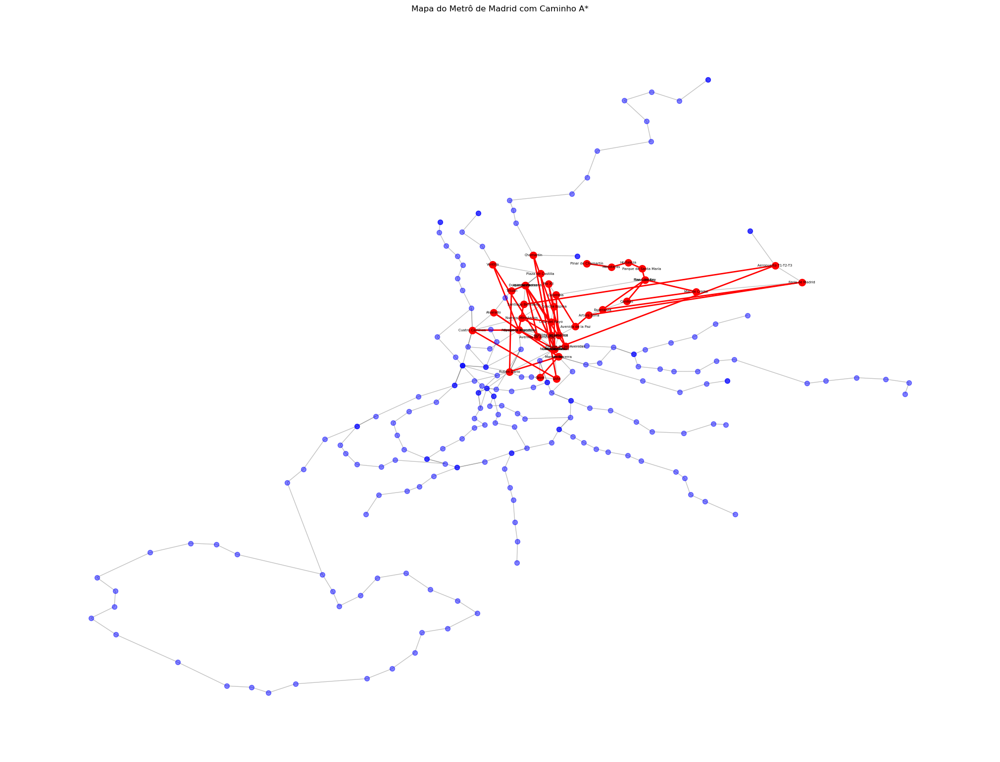

Tentativa Custo Real para Príncipe de Vergara : 10500.94
Atualizando Custo Real e Custo Estimado para Príncipe de Vergara :
   Custo Real: 10500.94
   Custo Estimado: 10500.961530979357
Tentativa Custo Real para Lista : 10637.32
Tentativa Custo Real para Manuel Becerra : 10798.86
Tentativa Custo Real para Velázquez : 10725.83
Atualizando Custo Real e Custo Estimado para Velázquez :
   Custo Real: 10725.83
   Custo Estimado: 10725.848272631034
-----------------------------------------------------------------------
Explorando nó: Alonso Cano
Custo Real: 10182.77
Custo Estimado: 10182.782440275363


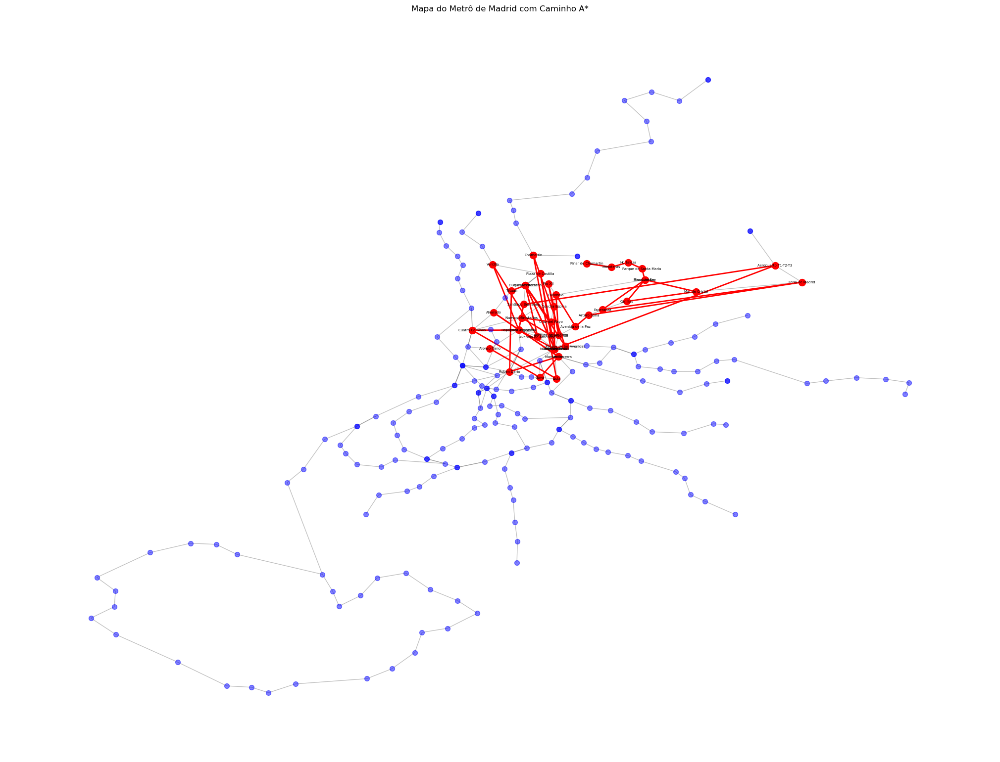

Tentativa Custo Real para Gregorio Marañón : 10870.37
Tentativa Custo Real para Canal : 10609.49
-----------------------------------------------------------------------
Explorando nó: Ríos Rosas
Custo Real: 10217.04
Custo Estimado: 10217.055227408002


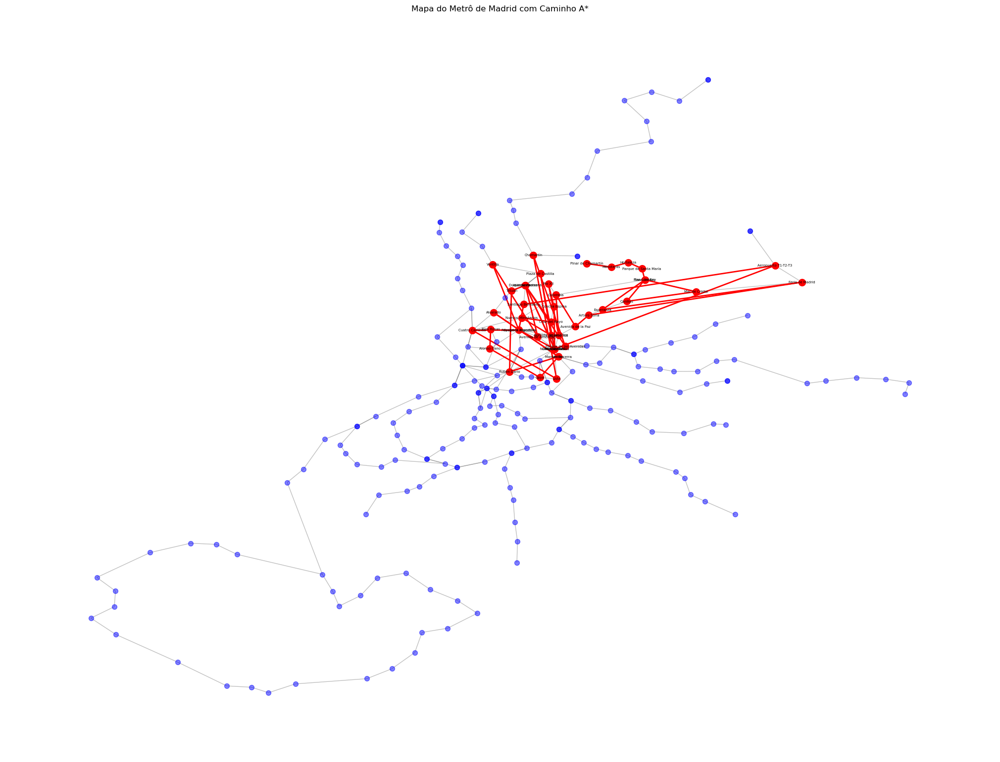

Tentativa Custo Real para Iglesia : 10972.130000000001
Atualizando Custo Real e Custo Estimado para Iglesia :
   Custo Real: 10972.130000000001
   Custo Estimado: 10972.139084329663
Tentativa Custo Real para Cuatro Caminos : 10878.54
-----------------------------------------------------------------------
Explorando nó: Guzmán el Bueno
Custo Real: 10220.320000000002
Custo Estimado: 10220.343010116745


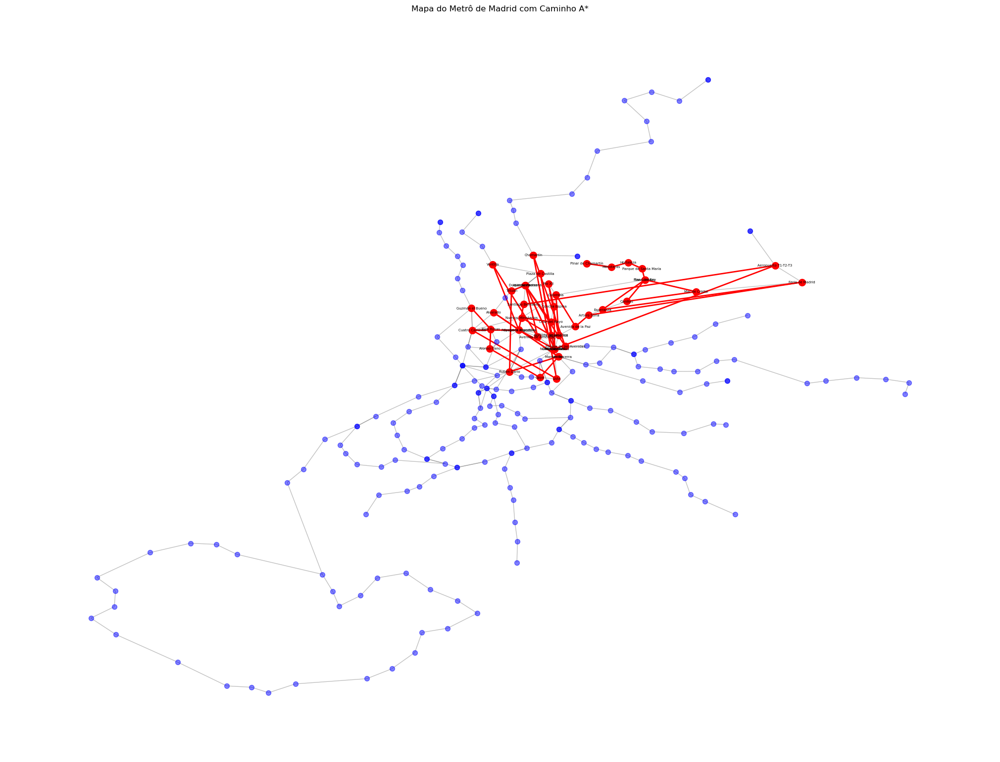

Tentativa Custo Real para Cuatro Caminos : 10885.100000000002
Tentativa Custo Real para Islas Filipinas : 11072.04
Atualizando Custo Real e Custo Estimado para Islas Filipinas :
   Custo Real: 11072.04
   Custo Estimado: 11072.058041692246
Tentativa Custo Real para Vicente Aleixandre : 10811.45
Atualizando Custo Real e Custo Estimado para Vicente Aleixandre :
   Custo Real: 10811.45
   Custo Estimado: 10811.477190945745
Tentativa Custo Real para Francos Rodríguez : 11332.060000000001
Atualizando Custo Real e Custo Estimado para Francos Rodríguez :
   Custo Real: 11332.060000000001
   Custo Estimado: 11332.092320797254
-----------------------------------------------------------------------
Explorando nó: Barajas
Custo Real: 10309.7
Custo Estimado: 10309.828555136504


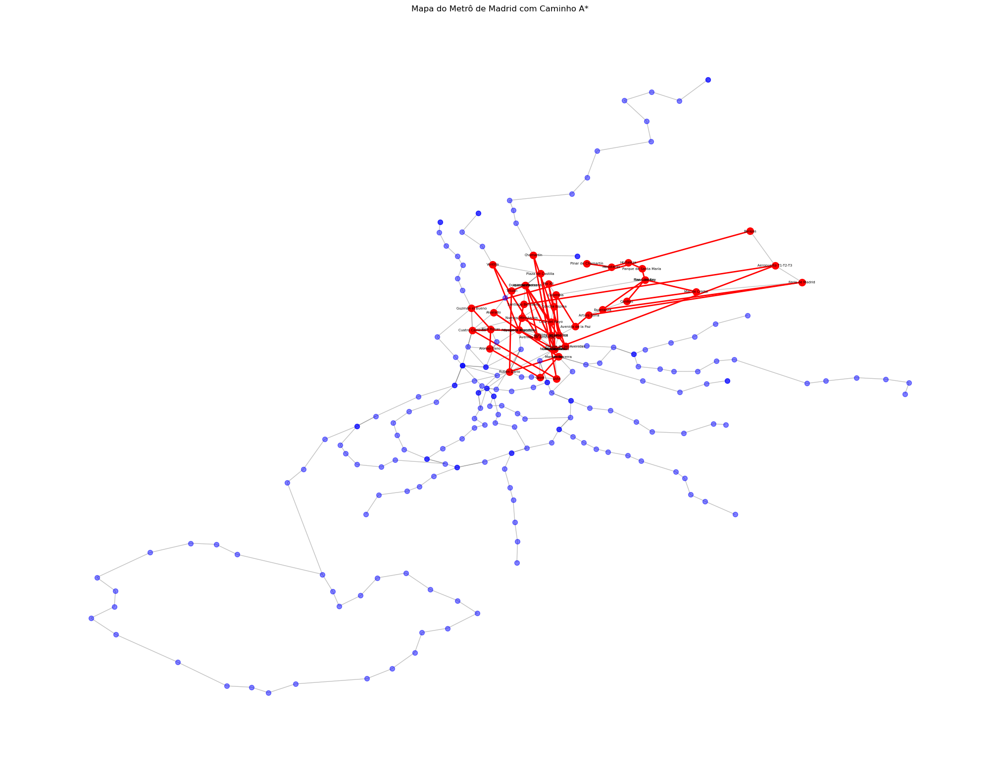

Tentativa Custo Real para Aeropuerto T1-T2-T3 : 11592.830000000002
Tentativa Custo Real para Aeropuerto T4 : 12259.32
Atualizando Custo Real e Custo Estimado para Aeropuerto T4 :
   Custo Real: 12259.32
   Custo Estimado: 12259.446154775638
-----------------------------------------------------------------------
Explorando nó: Bambú
Custo Real: 10394.120000000003
Custo Estimado: 10394.176470148117


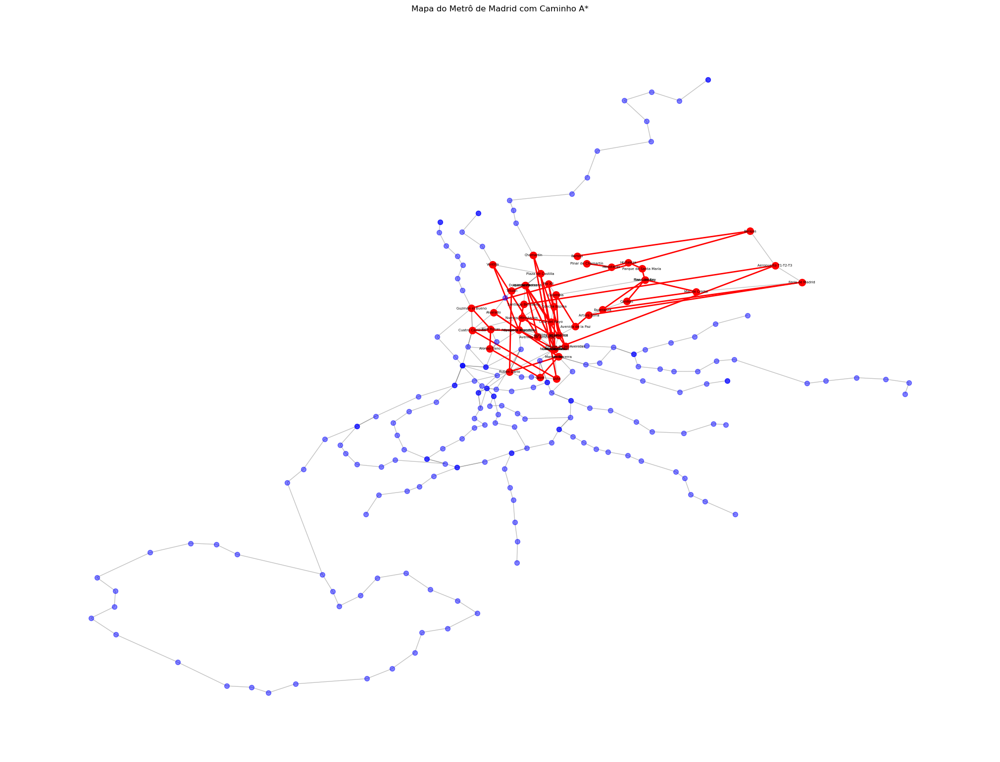

Tentativa Custo Real para Chamartín : 11148.830000000002
Tentativa Custo Real para Pinar de Chamartin : 11261.400000000003
Atualizando Custo Real e Custo Estimado para Pinar de Chamartin :
   Custo Real: 11261.400000000003
   Custo Estimado: 11261.463868710292
-----------------------------------------------------------------------
Explorando nó: Estrecho
Custo Real: 10403.04
Custo Estimado: 10403.068483962274


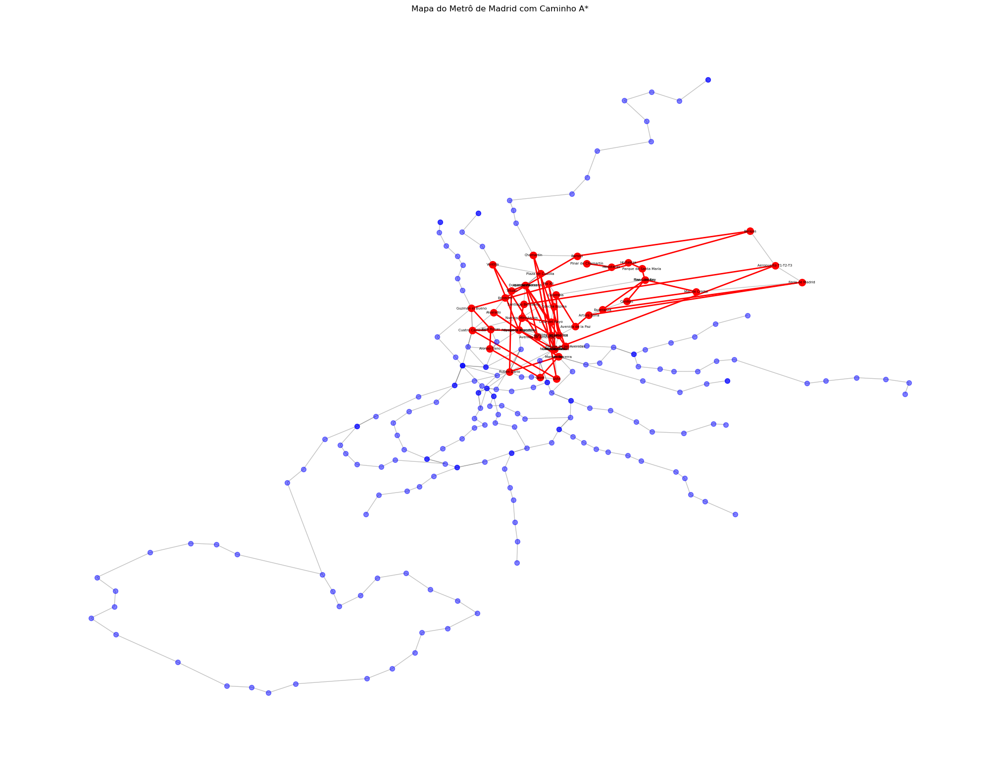

Tentativa Custo Real para Alvarado : 10892.43
Tentativa Custo Real para Tetuán : 11250.17
-----------------------------------------------------------------------
Explorando nó: Barrio del Pilar
Custo Real: 10447.04
Custo Estimado: 10447.09015483913


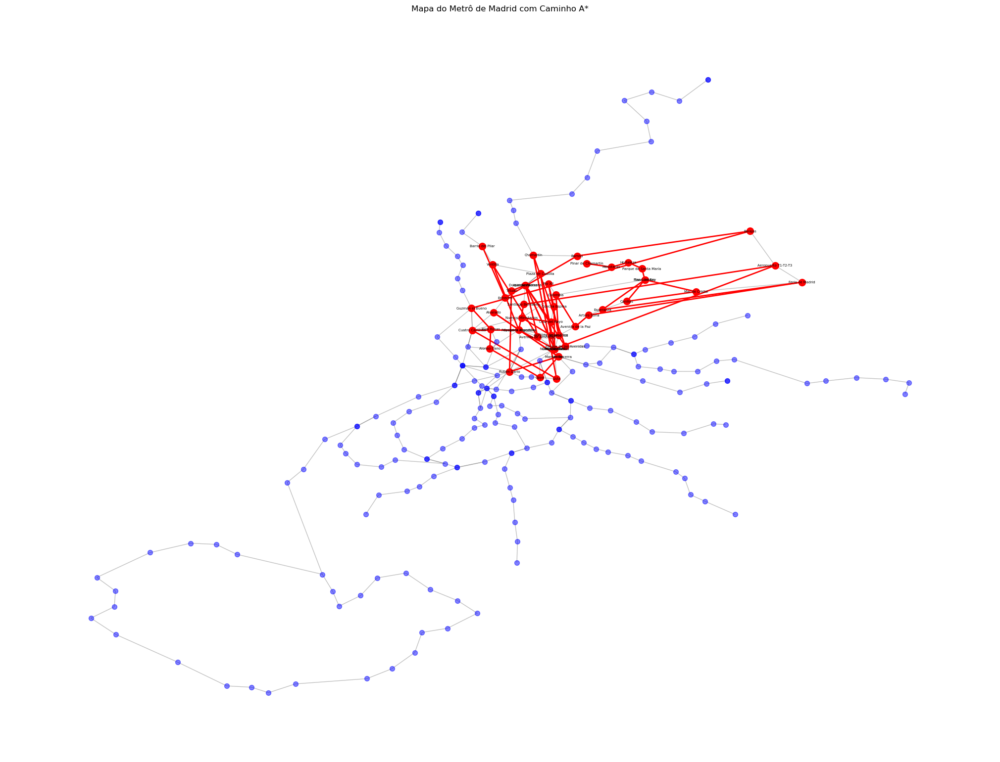

Tentativa Custo Real para Ventilla : 11409.18
Tentativa Custo Real para Herrera Oria : 11449.5
Atualizando Custo Real e Custo Estimado para Herrera Oria :
   Custo Real: 11449.5
   Custo Estimado: 11449.558807464593
-----------------------------------------------------------------------
Explorando nó: Príncipe de Vergara
Custo Real: 10500.94
Custo Estimado: 10500.961530979357


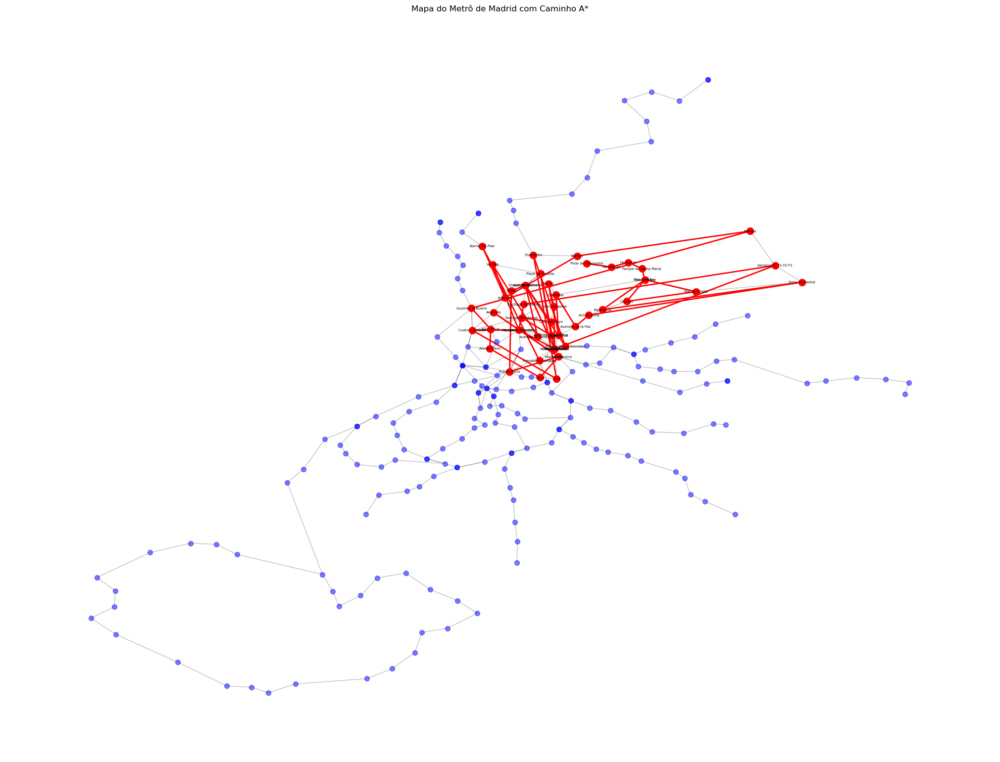

Tentativa Custo Real para Retiro : 11074.470000000001
Atualizando Custo Real e Custo Estimado para Retiro :
   Custo Real: 11074.470000000001
   Custo Estimado: 11074.486209755585
Tentativa Custo Real para Ibiza : 11050.51
Atualizando Custo Real e Custo Estimado para Ibiza :
   Custo Real: 11050.51
   Custo Estimado: 11050.53434268014
Tentativa Custo Real para Goya : 10877.050000000001
Tentativa Custo Real para Núñez de Balboa : 11622.41
-----------------------------------------------------------------------
Explorando nó: O'Donnell
Custo Real: 10513.18
Custo Estimado: 10513.212399750397


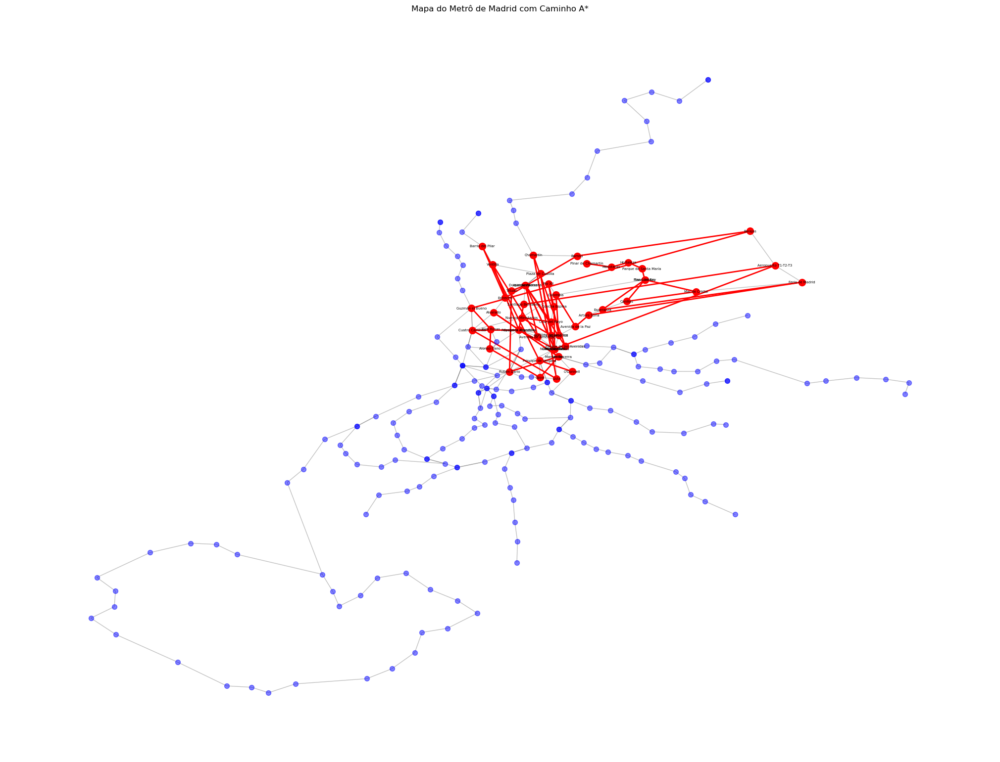

Tentativa Custo Real para Sainz de Baranda : 11369.800000000001
Atualizando Custo Real e Custo Estimado para Sainz de Baranda :
   Custo Real: 11369.800000000001
   Custo Estimado: 11369.833375513825
Tentativa Custo Real para Manuel Becerra : 11123.81
-----------------------------------------------------------------------
Explorando nó: Príncipe de Vergara
Custo Real: 10500.94
Custo Estimado: 10500.961530979357


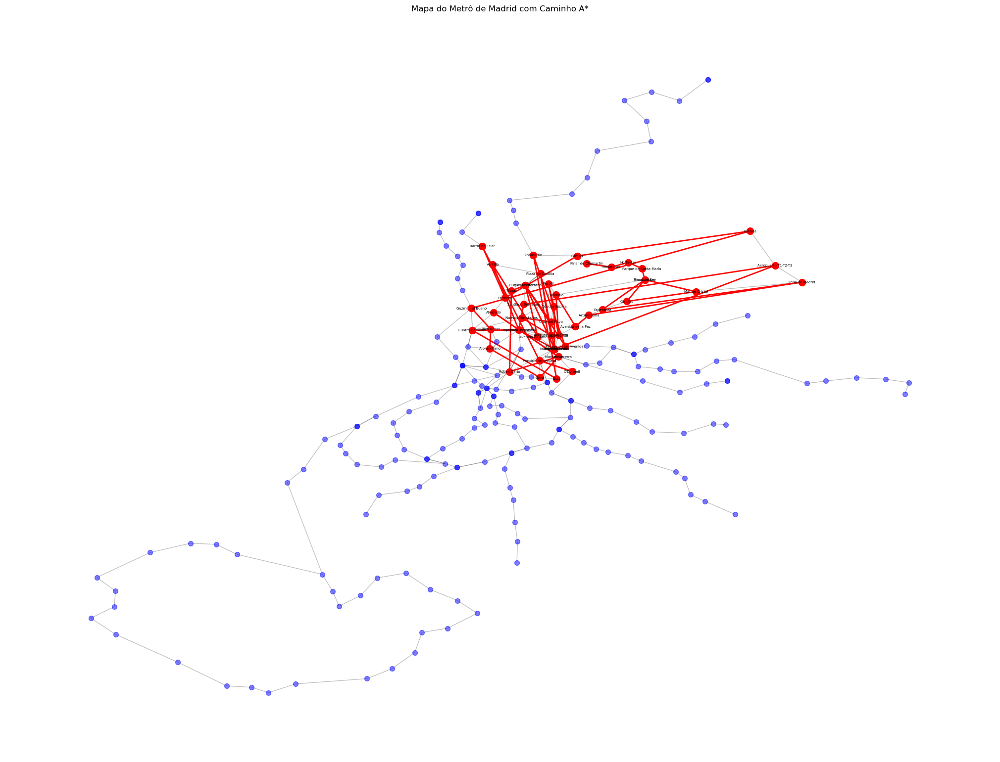

Tentativa Custo Real para Retiro : 11074.470000000001
Tentativa Custo Real para Ibiza : 11050.51
Tentativa Custo Real para Goya : 10877.050000000001
Tentativa Custo Real para Núñez de Balboa : 11622.41
-----------------------------------------------------------------------
Explorando nó: Canal
Custo Real: 10533.650000000001
Custo Estimado: 10533.662491236026


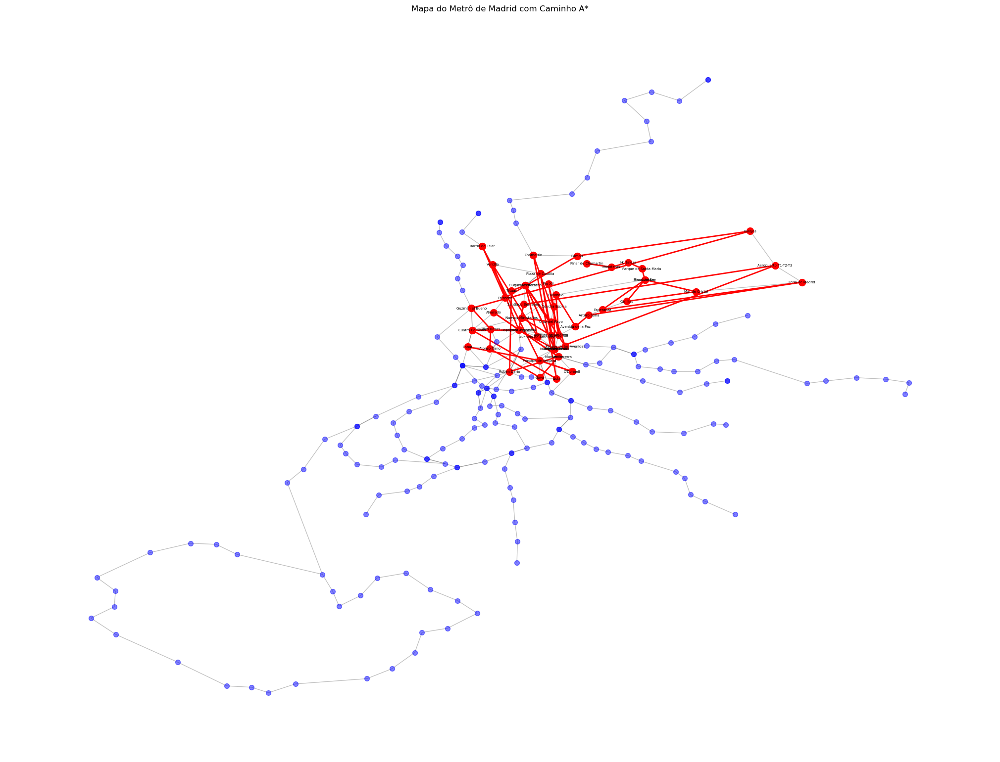

Tentativa Custo Real para Cuatro Caminos : 11511.760000000002
Tentativa Custo Real para Alonso Cano : 10960.37
Tentativa Custo Real para Quevedo : 11096.940000000002
Atualizando Custo Real e Custo Estimado para Quevedo :
   Custo Real: 11096.940000000002
   Custo Estimado: 11096.94767410615
Tentativa Custo Real para Islas Filipinas : 11338.440000000002
-----------------------------------------------------------------------
Explorando nó: El Carmen
Custo Real: 10577.240000000002
Custo Estimado: 10577.284046728011


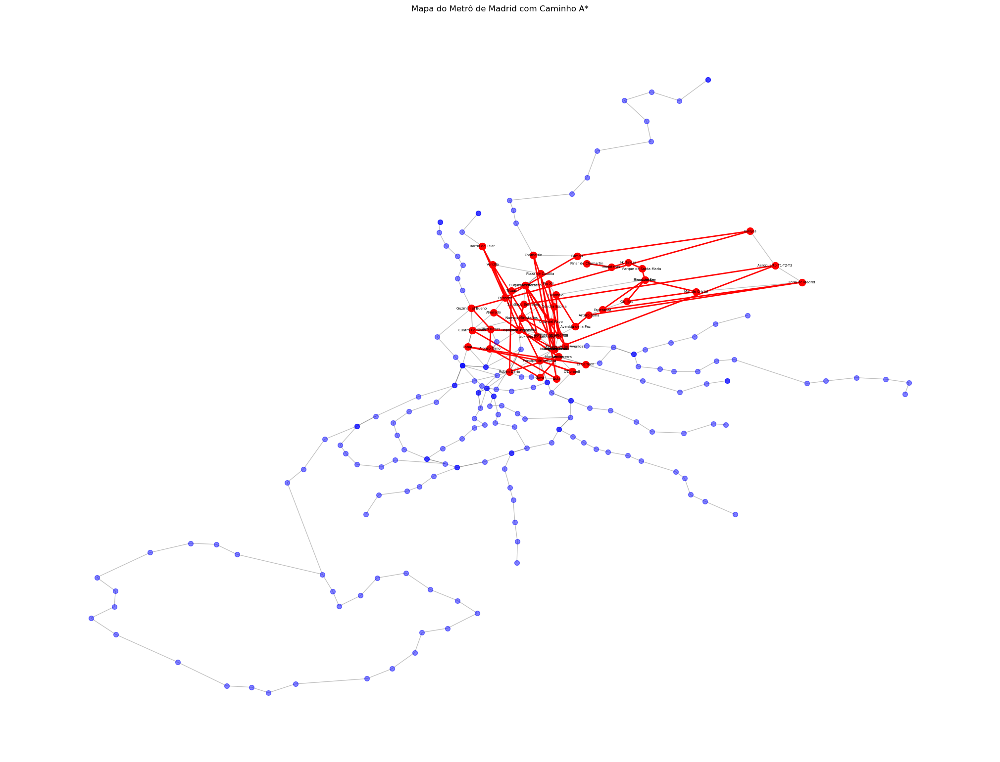

Tentativa Custo Real para Quintana : 11467.000000000002
Atualizando Custo Real e Custo Estimado para Quintana :
   Custo Real: 11467.000000000002
   Custo Estimado: 11467.0544460273
Tentativa Custo Real para Ventas : 11095.760000000002
-----------------------------------------------------------------------
Explorando nó: Begoña
Custo Real: 10599.730000000001
Custo Estimado: 10599.786476405654


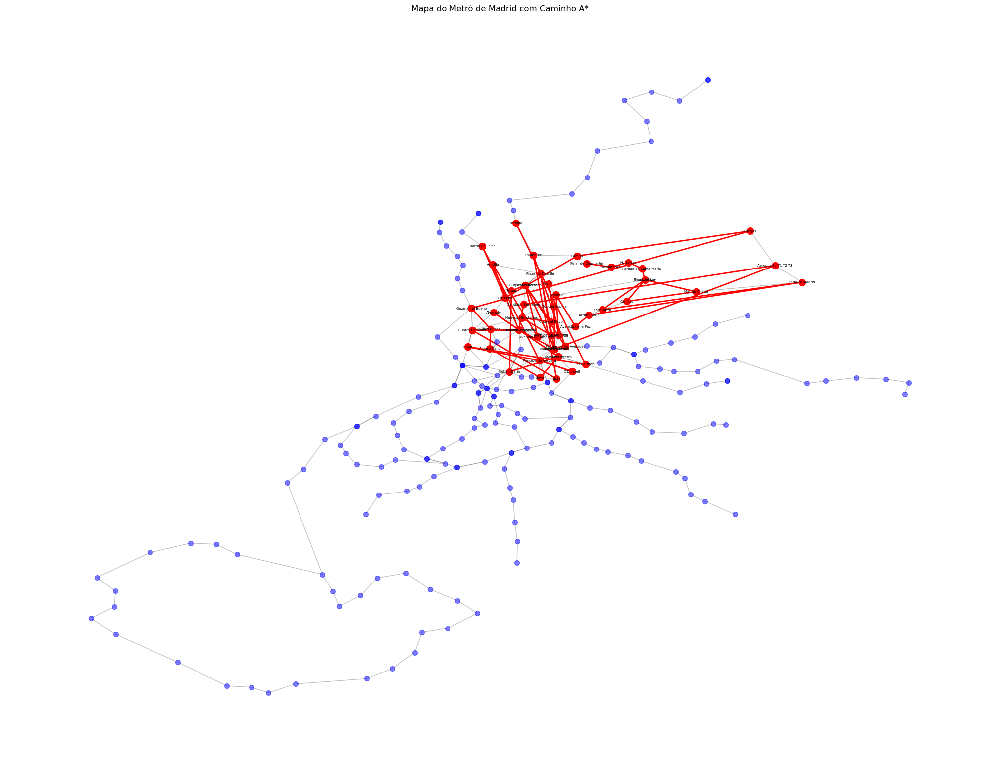

Tentativa Custo Real para Chamartín : 11560.050000000001
Tentativa Custo Real para Fuencarral : 12338.36
Atualizando Custo Real e Custo Estimado para Fuencarral :
   Custo Real: 12338.36
   Custo Estimado: 12338.4293620981
-----------------------------------------------------------------------
Explorando nó: Estrecho
Custo Real: 10403.04
Custo Estimado: 10403.068483962274


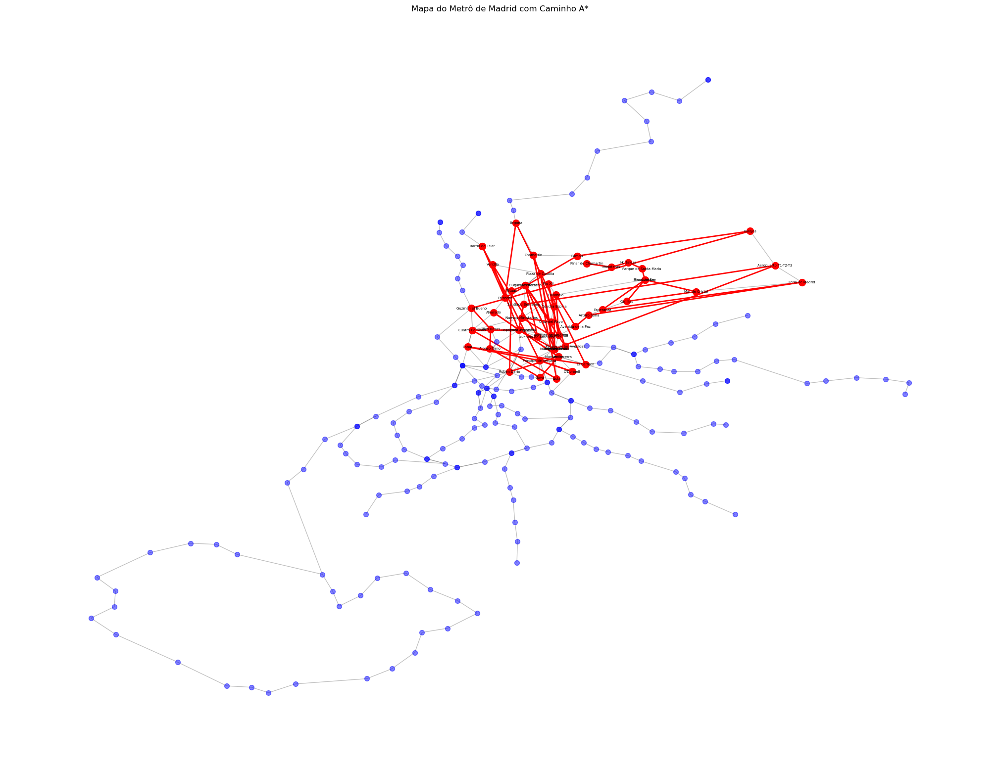

Tentativa Custo Real para Alvarado : 10892.43
Tentativa Custo Real para Tetuán : 11250.17
-----------------------------------------------------------------------
Explorando nó: Alonso Martínez
Custo Real: 10707.47
Custo Estimado: 10707.47550317235


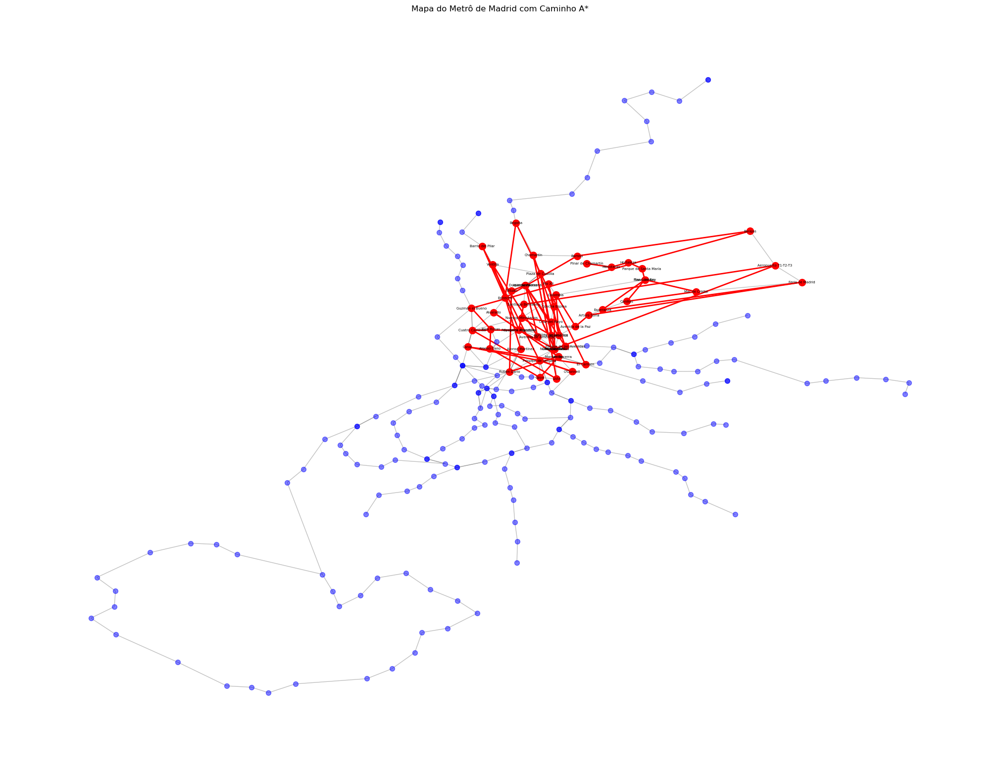

Tentativa Custo Real para Colón : 11200.34
Atualizando Custo Real e Custo Estimado para Colón :
   Custo Real: 11200.34
   Custo Estimado: 11200.35021035528
Tentativa Custo Real para Rubén Darío : 11536.519999999999
Tentativa Custo Real para Tribunal : 11188.199999999999
Atualizando Custo Real e Custo Estimado para Tribunal :
   Custo Real: 11188.199999999999
   Custo Estimado: 11188.199999999999
Tentativa Custo Real para Bilbao : 11260.039999999999
Atualizando Custo Real e Custo Estimado para Bilbao :
   Custo Real: 11260.039999999999
   Custo Estimado: 11260.04309091041
Tentativa Custo Real para Chueca : 11305.46
Atualizando Custo Real e Custo Estimado para Chueca :
   Custo Real: 11305.46
   Custo Estimado: 11305.465007971616
Tentativa Custo Real para Gregorio Marañón : 11919.769999999999
-----------------------------------------------------------------------
Explorando nó: Velázquez
Custo Real: 10725.83
Custo Estimado: 10725.848272631034


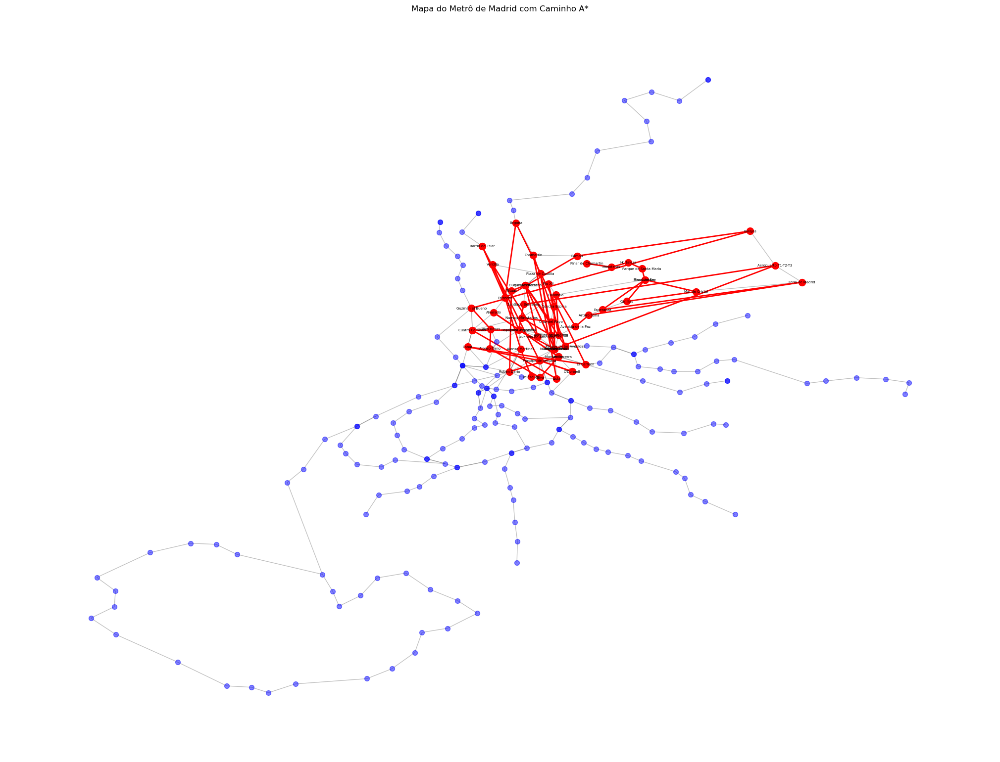

Tentativa Custo Real para Goya : 11326.83
Tentativa Custo Real para Serrano : 11039.59
Atualizando Custo Real e Custo Estimado para Serrano :
   Custo Real: 11039.59
   Custo Estimado: 11039.604573332783
-----------------------------------------------------------------------
Explorando nó: Barrio de la Concepción
Custo Real: 10744.250000000002
Custo Estimado: 10744.30116702791


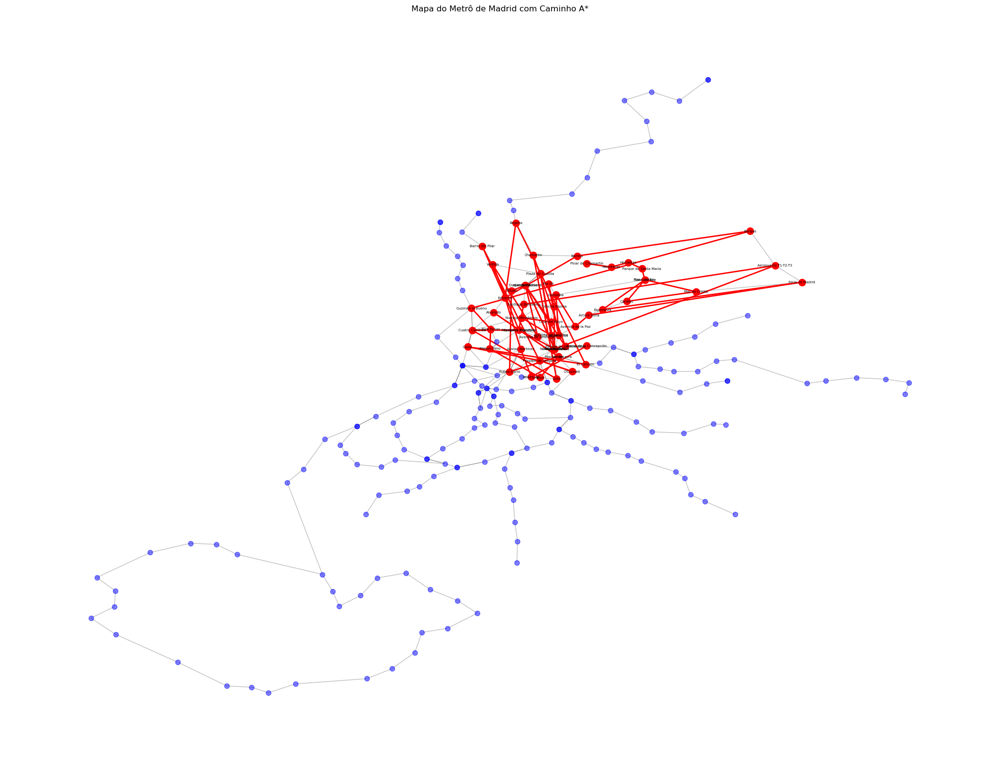

Tentativa Custo Real para Pueblo Nuevo : 11564.870000000003
Atualizando Custo Real e Custo Estimado para Pueblo Nuevo :
   Custo Real: 11564.870000000003
   Custo Estimado: 11564.929092655017
Tentativa Custo Real para Parque de las Avenidas : 11709.180000000002
-----------------------------------------------------------------------
Explorando nó: Vicente Aleixandre
Custo Real: 10811.45
Custo Estimado: 10811.477190945745


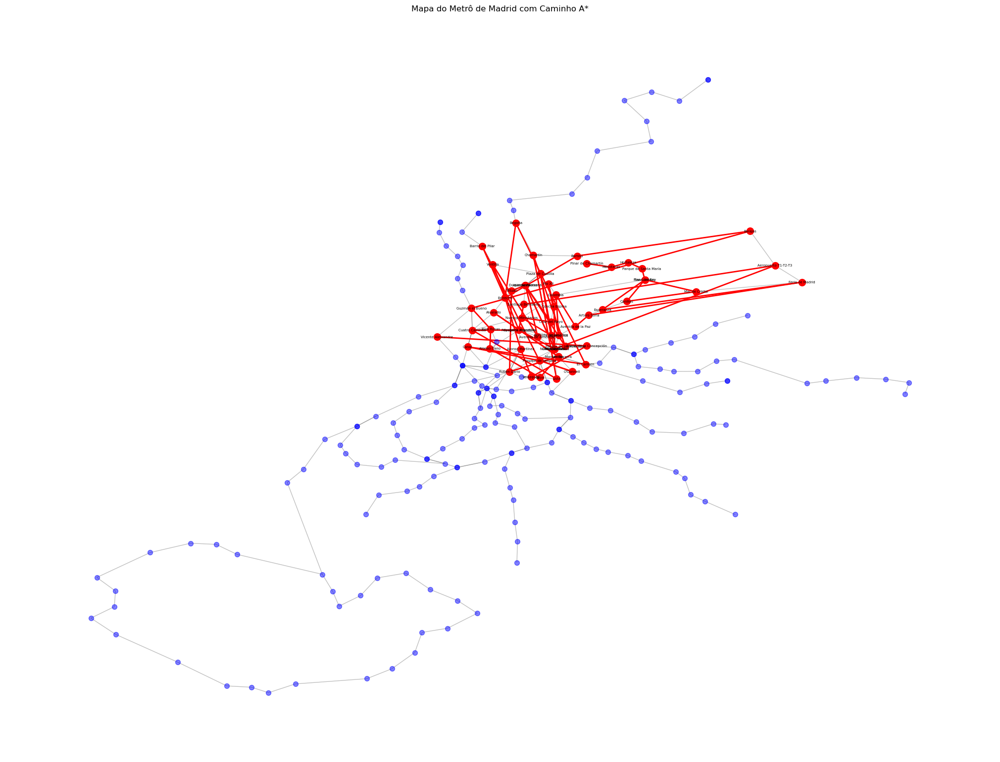

Tentativa Custo Real para Guzmán el Bueno : 11402.58
Tentativa Custo Real para Ciudad Universitaria : 11589.92
Atualizando Custo Real e Custo Estimado para Ciudad Universitaria :
   Custo Real: 11589.92
   Custo Estimado: 11589.951065646128
-----------------------------------------------------------------------
Explorando nó: Iglesia
Custo Real: 10972.130000000001
Custo Estimado: 10972.139084329663


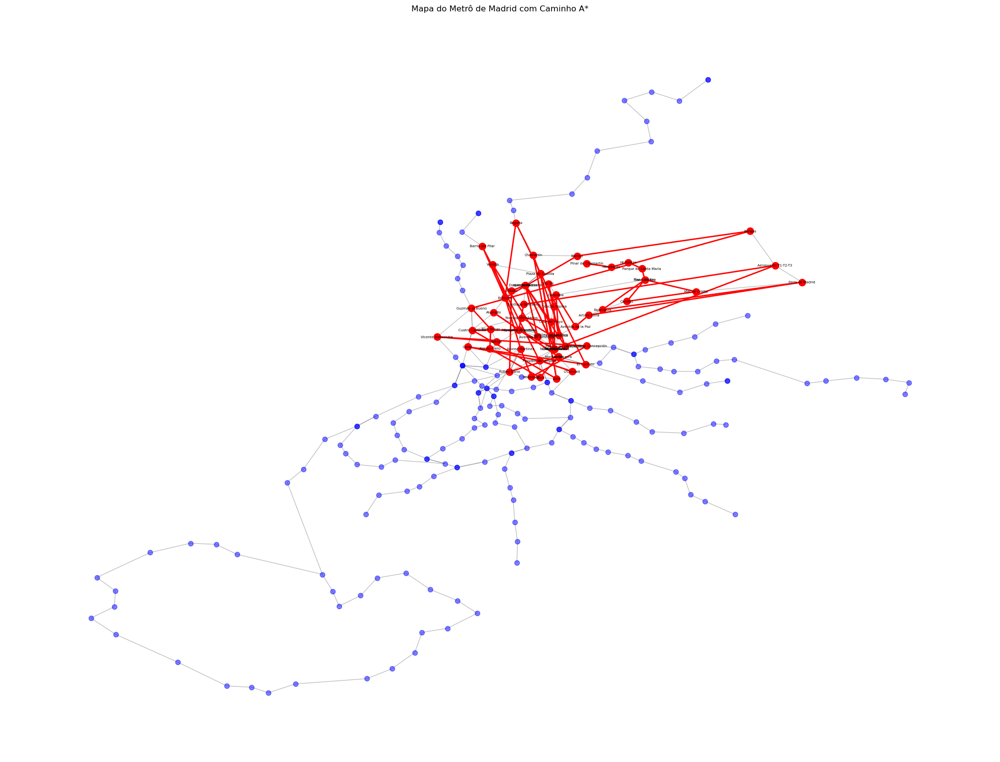

Tentativa Custo Real para Bilbao : 11686.69
Tentativa Custo Real para Ríos Rosas : 11727.220000000001
-----------------------------------------------------------------------
Explorando nó: Serrano
Custo Real: 11039.59
Custo Estimado: 11039.604573332783


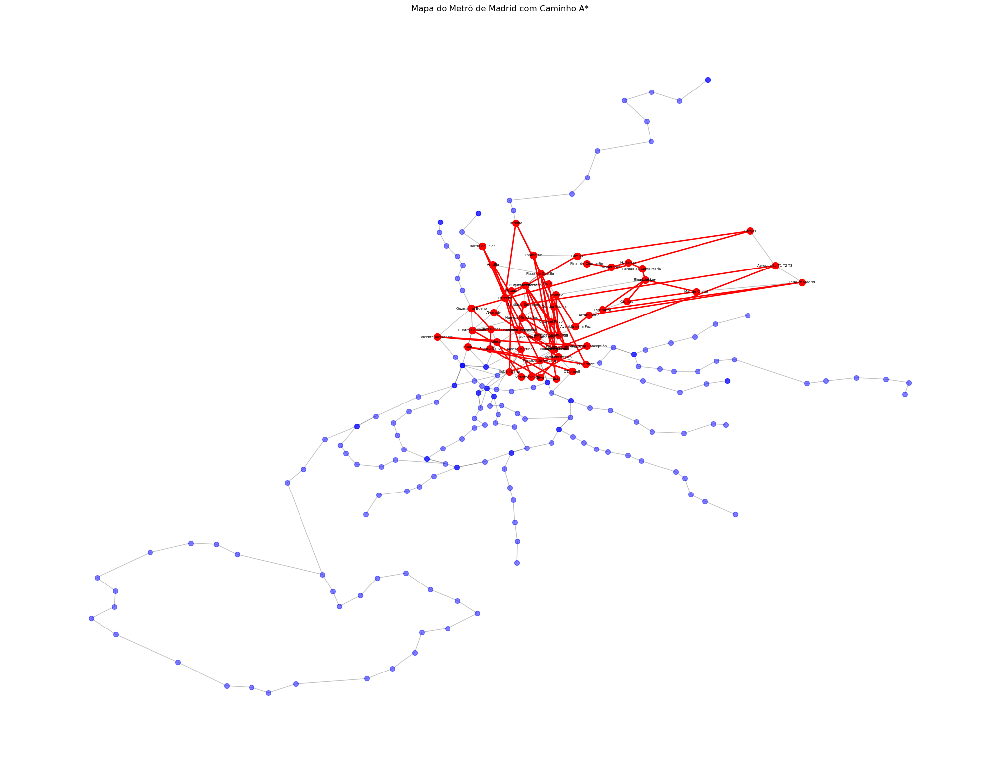

Tentativa Custo Real para Velázquez : 11353.35
Tentativa Custo Real para Colón : 11409.460000000001
-----------------------------------------------------------------------
Explorando nó: Ibiza
Custo Real: 11050.51
Custo Estimado: 11050.53434268014


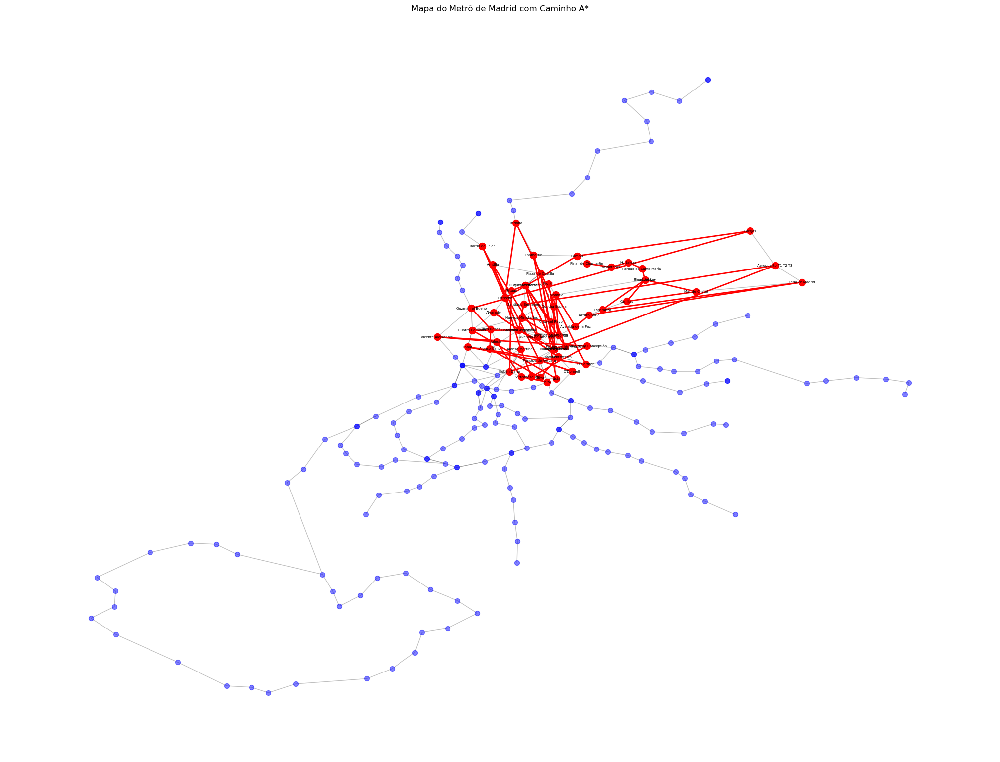

Tentativa Custo Real para Sainz de Baranda : 11859.51
Tentativa Custo Real para Príncipe de Vergara : 11600.08
-----------------------------------------------------------------------
Explorando nó: Islas Filipinas
Custo Real: 11072.04
Custo Estimado: 11072.058041692246


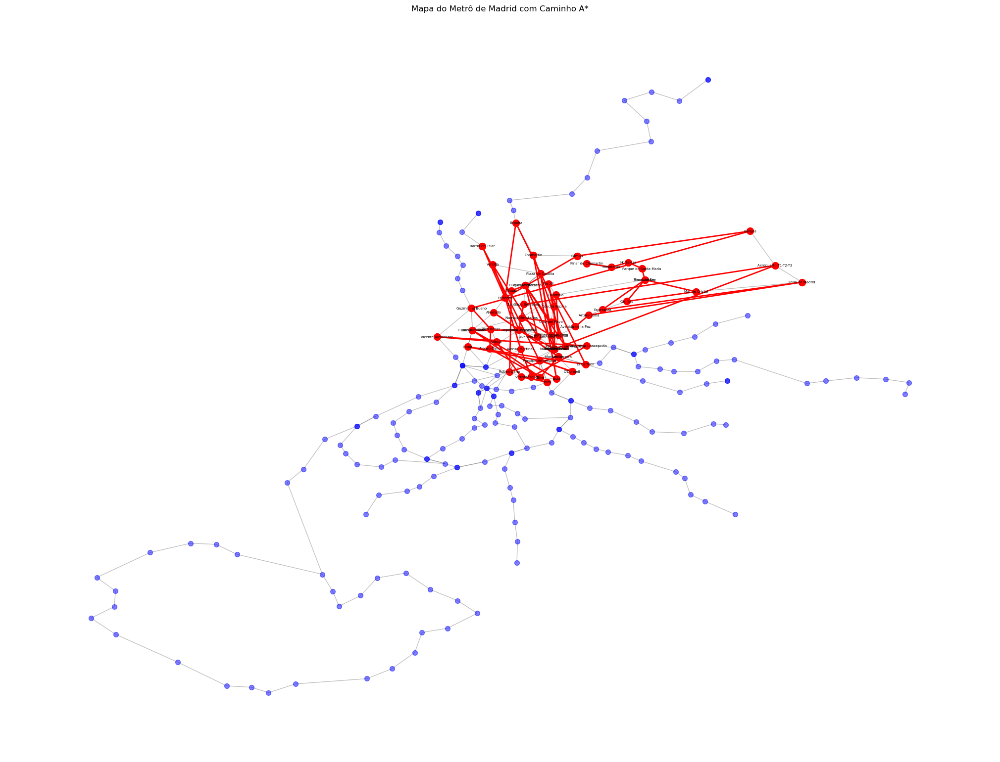

Tentativa Custo Real para Canal : 11876.830000000002
Tentativa Custo Real para Guzmán el Bueno : 11923.76
-----------------------------------------------------------------------
Explorando nó: Retiro
Custo Real: 11074.470000000001
Custo Estimado: 11074.486209755585


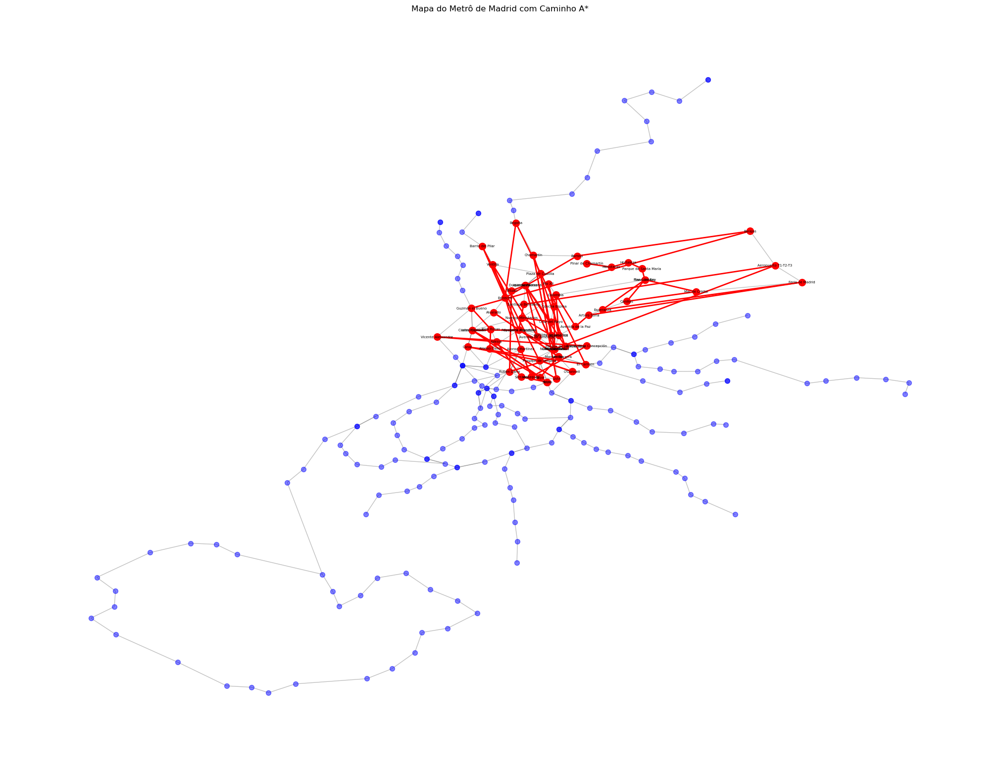

Tentativa Custo Real para Banco de España : 11876.400000000001
Atualizando Custo Real e Custo Estimado para Banco de España :
   Custo Real: 11876.400000000001
   Custo Estimado: 11876.409280381695
Tentativa Custo Real para Príncipe de Vergara : 11648.000000000002
-----------------------------------------------------------------------
Explorando nó: Quevedo
Custo Real: 11096.940000000002
Custo Estimado: 11096.94767410615


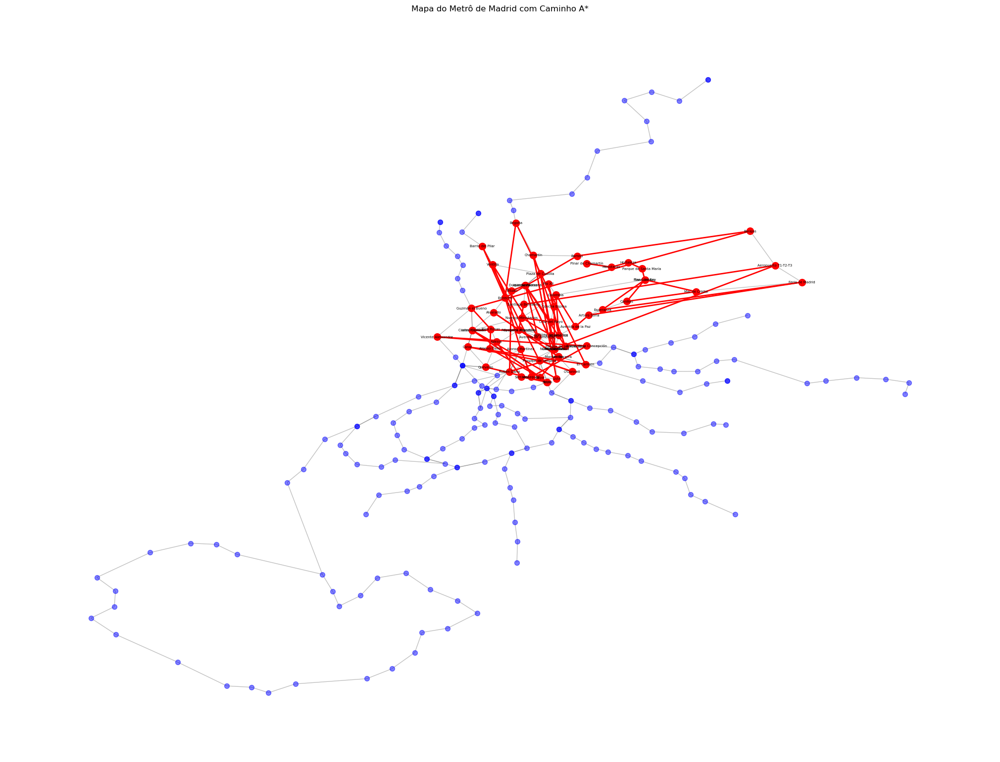

Tentativa Custo Real para Canal : 11660.230000000003
Tentativa Custo Real para San Bernardo : 11491.200000000003
Atualizando Custo Real e Custo Estimado para San Bernardo :
   Custo Real: 11491.200000000003
   Custo Estimado: 11491.206135840932
-----------------------------------------------------------------------
Explorando nó: Tribunal
Custo Real: 11188.199999999999
Custo Estimado: 11188.199999999999


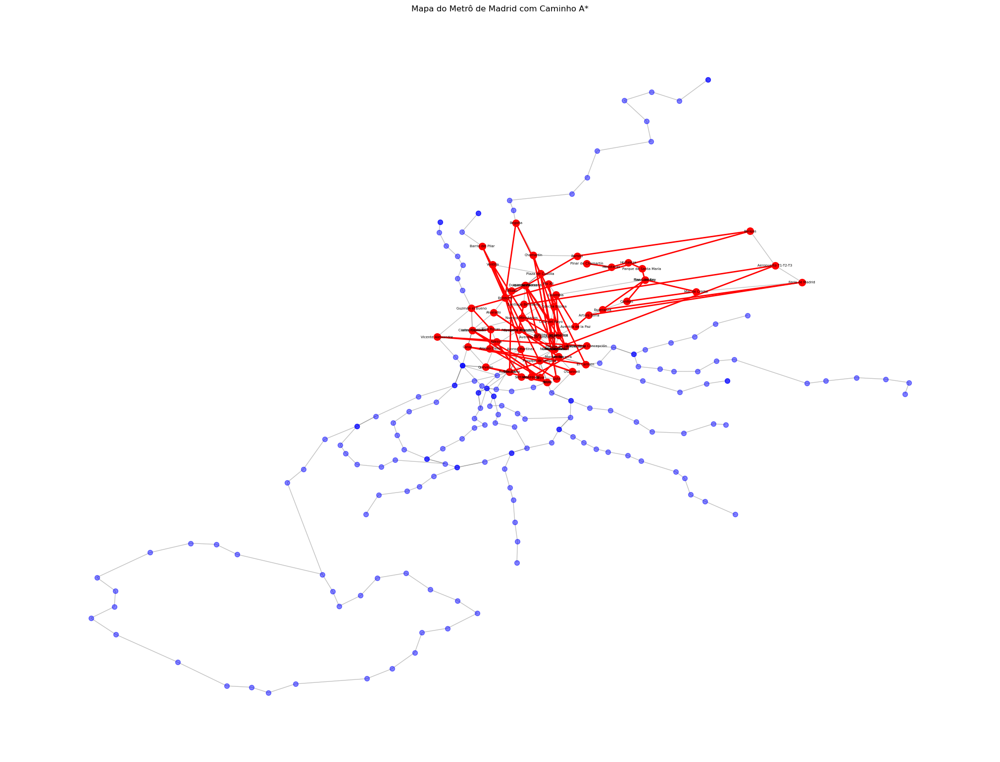

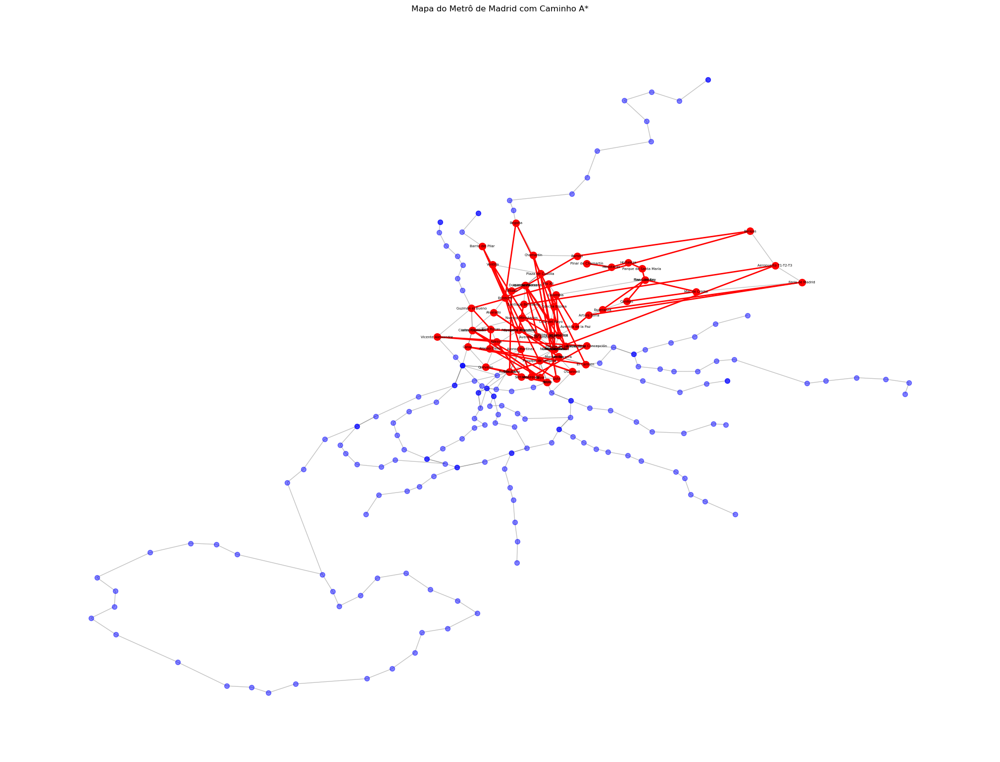

Caminho encontrado: ['Pinar de Chamartín', 'Manoteras', 'Hortaleza', 'Parque de Santa María', 'San Lorenzo', 'Mar de Cristal', 'Pinar del Rey', 'Colombia', 'Nuevos Ministerios', 'Gregorio Marañón', 'Alonso Martínez', 'Tribunal']
Número total de nós explorados: 68


In [202]:
stations_info = (
    df.drop_duplicates(subset="Station")
    .set_index("Station")[["Latitude", "Longitude"]]
    .T.to_dict("list")
)

start = "Pinar de Chamartín"
end = "Tribunal"

nodes_explored = 0

path, nodes_explored = a_star(graph, start, end, nodes_explored, stations_info)

print("Caminho encontrado:", path)
print("Número total de nós explorados:", nodes_explored)

In [ ]:
def total_distance(graph_df, path, start):
    distance = 0
    for i in path[1:]:
        distance += graph_df[
            (graph_df["Station"] == start) & (graph_df["Destination"] == i)
        ]["Distance"].iloc[0]
        start = i
    return round(distance, 2)

In [194]:
distance = total_distance(graph_df, path, start)
print(distance)

11188.2


In [195]:
def visualize_graph(graph_dict, df, path=None):
    # Criando o grafo NetworkX a partir do dicionário
    G = nx.Graph()
    for station, adjacents in graph_dict.items():
        for destination, distance in adjacents:
            G.add_edge(station, destination, weight=distance)

    # Adicionando posições ao grafo
    pos = {
        row["Station"]: (row["Longitude"], row["Latitude"])
        for idx, row in df.iterrows()
    }

    plt.figure(figsize=(20, 15))

    # Desenha os nós e arestas com estilo básico
    nx.draw(G, pos, node_size=50, node_color="blue", edge_color="gray", alpha=0.5)

    # Desenha o caminho com um estilo diferente, se existir
    if path:
        path_edges = list(zip(path, path[1:]))
        nx.draw_networkx_nodes(G, pos, nodelist=path, node_size=100, node_color="red")
        nx.draw_networkx_edges(G, pos, edgelist=path_edges, edge_color="red", width=2)
        # Cria rótulos apenas para os nós do caminho
        labels = {node: node for node in path}
        nx.draw_networkx_labels(G, pos, labels=labels, font_size=5)

    plt.title("Mapa do Metrô de Madrid com Caminho A*")
    plt.axis("off")
    plt.show()

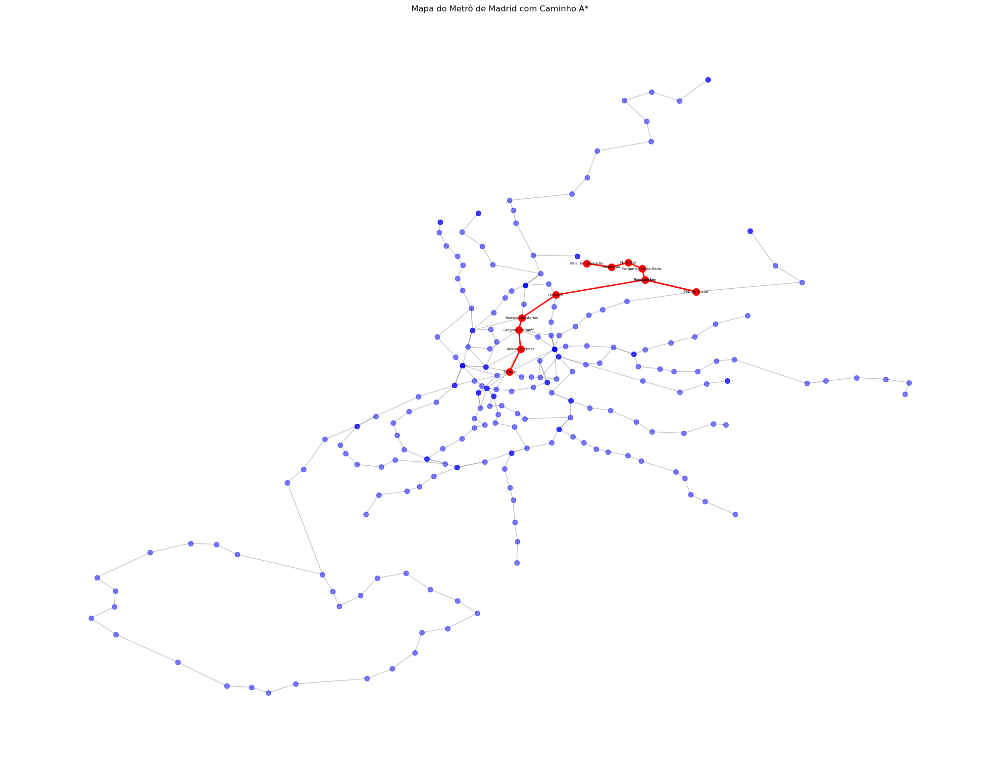

In [196]:
visualize_graph(graph, df, path)